# **Practical Session - Medical image segmentation**


# Introduction
The goal of this practical session is to test different segmentation methods seen in the courses on different types of medical images: X-ray scanner (CT) for the segmentation of the kidneys, MRI of the brain for the segmentation of the corpus callosum, temporal sequences of MRI images for the segmentation of the heart (left ventricle for example), dermoscopic images for the segmentation of skin lesions.

You will start by developing a (guided) pipelines to pre-process, identify and segment skin lesions in dermoscopic images. 
Then, you will have to develop a pipeline (not guided) for **AT LEAST** another application (segmentation of the kidneys, corpus callosum or heart).

You will have to write code and comments where you see **XXXXXXXXXXXXXXXXXXXXX**

**Deadline**: You will have to upload a single jupyter notebook .ipynb with your answers (code + text) before the deadline (please check on Ecampus/Moodle). 

**The uploaded file should be named 'TP_Seg_YOURSURNAME.ipynb'.** 

# Skin lesions

A skin lesion is defined as a superficial growth or patch of the skin that is visually different and/or has a different texture than its surrounding area. Skin lesions, such as moles or birthmarks, can degenerate and become melanoma, one of the deadliest skin cancer (more than 60k deaths in 2015 worldwide). Its incidence has been increasing during the last decades, especially in the areas mostly populated by white people.

The most effective treatment is an early detection followed by surgical excision. This is why several approaches for melanoma detection have been proposed in the last years (computer-aided diagnosis (CAD) ).

Let's start with downloading some dermoscopic images. You can use the following code and download them from my Google Drive

In [1]:
if 'google.colab' in str(get_ipython()):
    from google_drive_downloader import GoogleDriveDownloader as gdd

    gdd.download_file_from_google_drive(
        file_id='1BoU4S9xFgKaCtquU03kZQbH3Yv42oU_-',
        dest_path='./skinlesion.zip',
        unzip=True)
else:
    print(
        'You are not using Colab. Please define working_dir with the absolute path to the folder where you downloaded the data'
    )

# Please modify working_dir only if you are using your Anaconda (and not Google Colab)
# You should write the absolute path of your working directory with the data
Working_directory = "./"

You are not using Colab. Please define working_dir with the absolute path to the folder where you downloaded the data


You can list the content of the folder using the command line *!ls*

In [2]:
data_path = Working_directory + 'skinlesion'
!ls './skinlesion'

'ls' n'est pas reconnu en tant que commande interne
ou externe, un programme ex‚cutable ou un fichier de commandes.


All images are RGB images in format .jpg. You also have the corresponding ground truth (ie manual) segmentation in format .png 

In [3]:
import glob

listImages = glob.glob(data_path + '/*.jpg')
N = len(listImages)
print('There are {} images'.format(N))
print(listImages)

There are 13 images
['./skinlesion\\IM_000180.jpg', './skinlesion\\IM_000215.jpg', './skinlesion\\IM_000407.jpg', './skinlesion\\IM_000445.jpg', './skinlesion\\IM_000510.jpg', './skinlesion\\IM_000613.jpg', './skinlesion\\IM_000833.jpg', './skinlesion\\ISIC_0000001.jpg', './skinlesion\\ISIC_0000019.jpg', './skinlesion\\ISIC_0000042.jpg', './skinlesion\\ISIC_0000046.jpg', './skinlesion\\ISIC_0000095.jpg', './skinlesion\\ISIC_0000146.jpg']


Let's plot one image with the corresponding segmentation

im is composed of  uint8  going from  24  to  250
im_Seg is composed of :  uint8  - Max value:  255  - Min value:  0  - Unique values:  [  0   1   2   3   4   5   6   7   8   9  10  11  12 243 245 246 247 248
 249 250 251 252 253 254 255]


Text(0.5, 1.0, 'Image with mask')

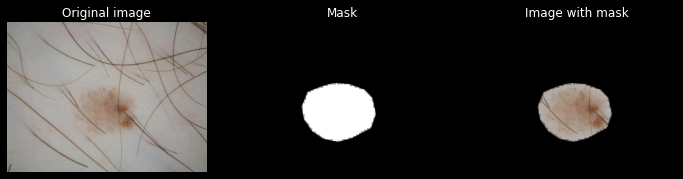

In [100]:
from skimage.io import imread
import numpy as np
import matplotlib.pyplot as plt

from mpl_toolkits.axes_grid1 import AxesGrid

# Choose a figure and plot it with the ground truth segmentation
indexIm = 1
filename = listImages[indexIm]
im = imread(filename)
print('im is composed of ', im.dtype, ' going from ', np.min(im), ' to ',
      np.max(im))
filename_Segmentation = filename[:-4] + '_Segmentation.png'
im_Seg = imread(filename_Segmentation)  # Value 0 or 255
print('im_Seg is composed of : ', im_Seg.dtype, ' - Max value: ',
      np.max(im_Seg), ' - Min value: ', np.min(im_Seg), ' - Unique values: ',
      np.unique(im_Seg))
im_Seg_bool = im_Seg == 255
im_Seg_expand = np.expand_dims(im_Seg_bool, axis=2)
im_mul_mask = (im_Seg_expand * im)  # pixel-wise product

fig = plt.figure(figsize=(12, 12))
grid = AxesGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.5)
grid[0].imshow(im)
grid[0].axis('off')
grid[0].set_title("Original image")
grid[1].imshow(im_Seg_bool, cmap='gray')
grid[1].axis('off')
grid[1].set_title("Mask")
grid[2].imshow(im_mul_mask)
grid[2].axis('off')
grid[2].set_title("Image with mask")

First, let's simplify the problem by using only the blue channel and rescaling the figure

Text(0.5, 1.0, 'Rescaled image with rescaled mask')

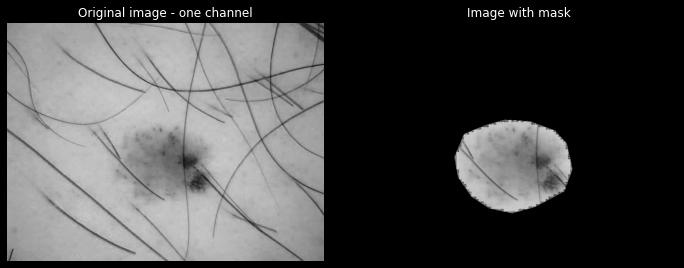

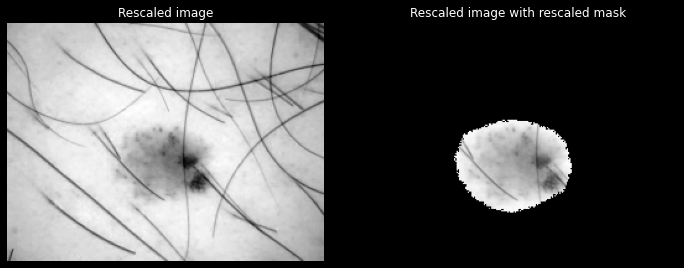

In [5]:
from skimage.transform import rescale
from skimage import img_as_bool

# We only select the blue channel to start
imb = im[:, :, 2]

# We rescale to speed up computations
imbr = np.uint8(
    rescale(imb, 0.25, anti_aliasing=True, order=1, preserve_range=True))
im_Seg_r = rescale(im_Seg,
                   0.25,
                   anti_aliasing=False,
                   order=0,
                   preserve_range=True)
im_Seg_r_bool = im_Seg_r == 255  # binary mask

fig = plt.figure(figsize=(12, 12))
grid = AxesGrid(fig, 111, nrows_ncols=(1, 2), axes_pad=0.5)
grid[0].imshow(imb, cmap='gray')
grid[0].axis('off')
grid[0].set_title("Original image - one channel")
grid[1].imshow(imb * im_Seg_bool, cmap='gray')
grid[1].axis('off')
grid[1].set_title("Image with mask")

fig = plt.figure(figsize=(12, 12))
grid = AxesGrid(fig, 111, nrows_ncols=(1, 2), axes_pad=0.5)
grid[0].imshow(imbr, cmap='gray')
grid[0].axis('off')
grid[0].set_title("Rescaled image")
grid[1].imshow(imbr * im_Seg_r_bool, cmap='gray')
grid[1].axis('off')
grid[1].set_title("Rescaled image with rescaled mask")

## KMeans

Now, let's try to use K-means to directly segment the image. We will use the scikit-learn implementation.

You should choose the number of clusters. Start with 2 and then look what it happens when you increase the number of clusters.

Be careful: Kmeans randomly assigns the labels of the clusters (0,1,2,...,K).

**Question**: You need to propose a method to assign the label 1 to the cluster (or clusters) containing the skin lesion and 0 for the other clusters. Look at the different images and try simple solutions (look at the position of the lesion for instance...). You can use the Dice score, defined as $DSC=\frac{2TP}{2TP+FP+FN}$ for boolean data, to quantitavely compare the reference segmentation with the one you estimate.

**Answer**: On constate qu'avec seulement 2 clusters, beaucoup de zones vont se retrouvées prises avec la lésion comme les poils ou des zones plus sombres. Pour plus de 3 clusters, la lésion se retrouve assigné à plusieurs classes différentes. On ne considère alors que 3 clusters.

Puisque les lésions sont toujours au centre de l'image, on détermine la classe majoritaire sur un carré centré sur le milieu de l'image.

The dice similarity is  0.34147305981216014


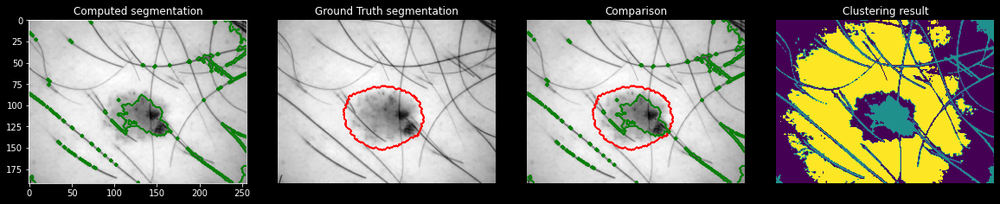

In [6]:
from sklearn.cluster import KMeans
from skimage import morphology
from scipy.spatial.distance import dice

Ncluster = 3

x, y = imbr.shape
imFloat = np.array(
    imbr,
    dtype=np.float64) / 255  # transform into float for computational reason
kmeans = KMeans(n_clusters=Ncluster)  # use K-means algorithm
kmeansSeg = kmeans.fit_predict(imFloat.reshape(
    -1, 1))  # fit to the data reshaped as a 1D vector
kmeansSeg = np.reshape(kmeansSeg, (x, y))  # reshape as the initial image

#plt.figure()
#plt.hist(kmeansSeg.reshape(-1,1))
#plt.title('Histogram of estimated labels')
#plt.show()

mean_x, mean_y = x // 2, y // 2  # Milieu de l'image
search_zone = 10
kmeans_Seg_center = kmeansSeg[mean_x - search_zone:mean_x + search_zone,
                              mean_y - search_zone:mean_y + search_zone]

index_lesion = 0  #Index de la région majoritaire
nb_pixel_class = 0  #Nombre de pixel de la région majoritaire
for k in range(Ncluster):
    pixel_k = np.sum(kmeans_Seg_center == k)
    if pixel_k > nb_pixel_class:
        index_lesion = k
        nb_pixel_class = pixel_k

#print(f"On retient comme label de la lésion {index_lesion}.")
#plt.imshow(kmeans_Seg_center)
#plt.colorbar()
#plt.title("Segmentation of the middle of the image")
#plt.show()

kmeansSeg_bool = kmeansSeg == index_lesion

print('The dice similarity is ',
      1 - dice(kmeansSeg_bool.flatten(), im_Seg_r_bool.flatten()))

fig = plt.figure(figsize=(20, 12))
grid = AxesGrid(fig, 111, nrows_ncols=(1, 4), axes_pad=0.5)
grid[0].imshow(imbr, cmap='gray')
grid[0].contour(morphology.opening(kmeansSeg_bool, morphology.disk(1)),
                colors='green',
                linewidths=1)
#grid[0].axis('off')
grid[0].set_title("Computed segmentation")
grid[1].imshow(imbr, cmap='gray')
grid[1].contour(morphology.opening(im_Seg_r_bool, morphology.disk(1)),
                colors='red',
                linewidths=1)
grid[1].axis('off')
grid[1].set_title("Ground Truth segmentation")
grid[2].imshow(imbr, cmap='gray')
grid[2].contour(morphology.opening(im_Seg_r_bool, morphology.disk(1)),
                colors='red',
                linewidths=1)
grid[2].contour(morphology.opening(kmeansSeg_bool, morphology.disk(1)),
                colors='green',
                linewidths=1)
grid[2].axis('off')
grid[2].set_title("Comparison")
grid[3].imshow(kmeansSeg)
grid[3].axis('off')
grid[3].set_title("Clustering result")
plt.show()

## Mathematical Morphology

You could also use the morphological operators seen during the previous lectures to segment the skin lesions. First, we will remind you some morphological operators that you could use to segment the lesion. Please note that the structural elements and the hyper-parameters have been randomly chosen... you should probably change them.

**Question**: Propose a pipeline using morphological operators to segment the skin lesions and motivate your choices.

**Answer** :
Tout d'abord on pré-traite toutes les images en appliquant DullRazor. Ensuite on va utiliser le résultat obtenu en appliquant un watershedding sur le gradient morphologique à partir des minima locaux. Il s'agit de considérer la région la plus au centre comme la région de la lésion. On va ensuite itérativement fusionner toutes les régions tel que la différence de la moyenne de l'intensité de cette région et du masque de segmentation courrant soit inférieur à un certain seuil.

In [7]:
import skimage.morphology as morpho
from skimage.draw import line


def strel(forme, taille, angle=45):
    """renvoie un element structurant de forme  
     'diamond'  boule de la norme 1 fermee de rayon taille
     'disk'     boule de la norme 2 fermee de rayon taille
     'square'   carre de cote taille (il vaut mieux utiliser taille=impair)
     'line'     segment de langueur taille et d'orientation angle (entre 0 et 180 en degres)
      (Cette fonction n'est pas standard dans python)
    """

    if forme == 'diamond':
        return morpho.diamond(taille)
    if forme == 'disk':
        return morpho.disk(taille)
    if forme == 'square':
        return morpho.square(taille)
    if forme == 'line':
        angle = int(-np.round(angle))
        angle = angle % 180
        angle = np.float32(angle) / 180.0 * np.pi
        x = int(np.round(np.cos(angle) * taille))
        y = int(np.round(np.sin(angle) * taille))
        if x**2 + y**2 == 0:
            if abs(np.cos(angle)) > abs(np.sin(angle)):
                x = int(np.sign(np.cos(angle)))
                y = 0
            else:
                y = int(np.sign(np.sin(angle)))
                x = 0
        rr, cc = line(0, 0, y, x)
        rr = rr - rr.min()
        cc = cc - cc.min()
        img = np.zeros((rr.max() + 1, cc.max() + 1))
        img[rr, cc] = 1
        return img
    raise RuntimeError('Erreur dans fonction strel: forme incomprise')

## Proposed approach

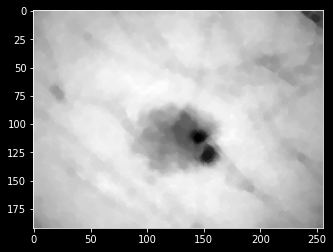

In [8]:
#fermeture par un disque (remove small dark parts)
sizeDisque = 3
disk = strel('disk', sizeDisque)
closeDisk = morpho.closing(imbr, disk)

plt.figure()
plt.imshow(closeDisk, cmap='gray')
plt.show()

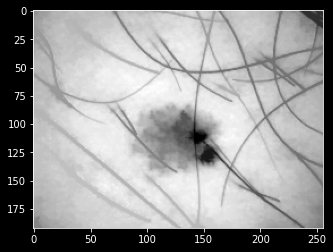

In [9]:
# Reconstruction par erosion
RecEr = np.max(imbr) - morpho.reconstruction(
    np.max(imbr) - closeDisk,
    np.max(imbr) - imbr)
plt.figure()
plt.imshow(RecEr, cmap='gray')
plt.show()

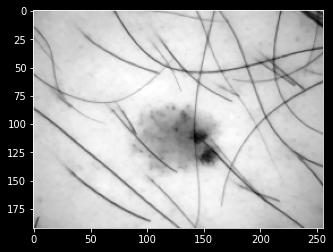

In [10]:
# Overture (remove small bright parts)
se = strel('disk', 1)
Open = morpho.opening(imbr, se)

plt.figure()
plt.imshow(Open, cmap='gray')
plt.show()

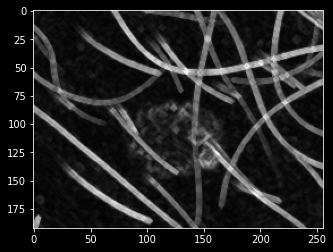

In [11]:
from scipy import ndimage as ndi
from skimage.segmentation import watershed
from skimage.filters import rank
from skimage.util import img_as_ubyte
from skimage.morphology import disk
from skimage import morphology
#gradient morphologique de l'image initiale
se = morpho.disk(2)
grad = morpho.dilation(imbr, se) - morpho.erosion(imbr, se)

plt.figure()
plt.imshow(grad, cmap='gray')
plt.show()

Text(0.5, 1.0, 'Opening de fermeture')

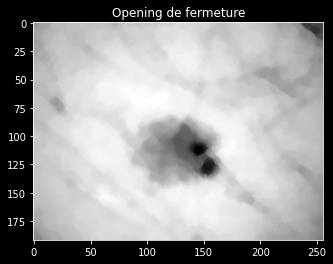

In [12]:
# Overture (remove small bright parts)
se = strel('disk', 2)
Open = morpho.opening(closeDisk, se)

plt.imshow(Open, cmap='gray')
plt.title("Opening de fermeture")

Méthode de segmentation par watershedding à partir du gradient morphologique en utilisant les minima régionnaux


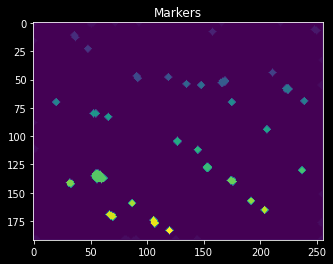

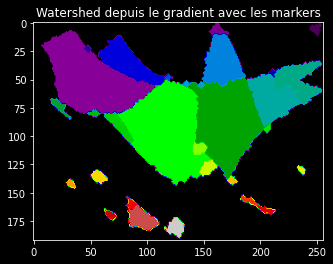

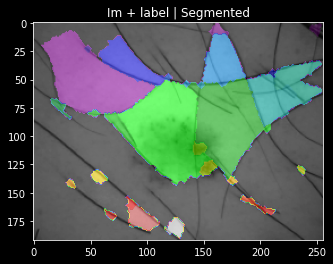

On retient la région  19
On choisit comme segmentation la région du centre de l'image


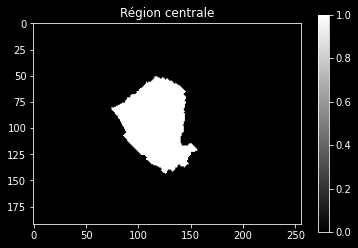

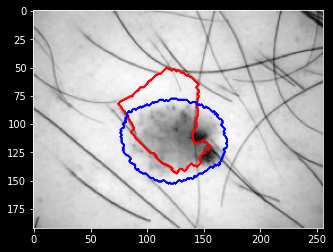

The dice similarity is  0.6125218464069087


In [13]:
show_first_plots = 0
show_final_plots = 1
# Minima regionaux
print(
    'Méthode de segmentation par watershedding à partir du gradient morphologique en utilisant les minima régionnaux'
)

maxIm = 255
temp = Open.copy()

for i in range(Open.shape[0]):
    for j in range(Open.shape[1]):
        if Open[i, j] < maxIm:
            temp[i, j] = Open[i, j] + 1
reco = maxIm - morpho.reconstruction(maxIm - temp, maxIm - Open)
minReg = np.uint8(reco) - Open

if show_first_plots:
    plt.figure()
    plt.imshow(minReg, cmap='gray')
    plt.title("Minima locaux")
    plt.show()

#suppression des marqueurs trop petits
tailleMin = 1
seM = strel('disk', tailleMin)
minReg = morpho.opening(minReg, seM)

if show_first_plots:
    plt.figure()
    plt.imshow(minReg, cmap='gray')
    plt.title("Minima locaux sans les trop petits")
    plt.show()

#ajout d'un marqueur sur le bord de l'image
for i in range(minReg.shape[0]):
    minReg[i, 0] = 1
    minReg[i, minReg.shape[1] - 1] = 1
for j in range(minReg.shape[1]):
    minReg[0, j] = 1
    minReg[minReg.shape[0] - 1, j] = 1

if show_first_plots:
    plt.figure()
    plt.imshow(minReg, cmap='gray')
    plt.title("Mnimaux locaux nettoyés avec marqueurs sur les côtés")
    plt.show()

#Any non-zero values in input are counted as features and zero values are considered the background.
markers = ndi.label(minReg)[0]

plt.figure()
plt.imshow(markers)
plt.title("Markers")
plt.show()

# We use the watershed algorithm to compute the labels
labels = watershed(grad, markers)

plt.figure()
plt.imshow(labels, cmap=plt.cm.nipy_spectral)
plt.title("Watershed depuis le gradient avec les markers")
plt.show()

plt.figure()
plt.imshow(imbr, cmap=plt.cm.gray)
plt.imshow(labels, cmap=plt.cm.nipy_spectral, alpha=.55)
plt.title("Im + label | Segmented")
plt.show()
#%% visualiation du resultat

segm = labels.copy()
# Choose the area of the center
index = labels[labels.shape[0] // 2, labels.shape[1] // 2]
print("On retient la région ", index)
segm = segm == index

if show_final_plots:
    print("On choisit comme segmentation la région du centre de l'image")
    plt.imshow(segm, cmap='gray')
    plt.colorbar()
    plt.title("Région centrale")
    plt.show()
    #NB: ce resultat peut servir d'initialisation pour une autre methode de segmentation (croissance de regions, segmentation markovienne, etc.)

    #superposition des contours de la segmentation a l'image initiale
    plt.figure()
    plt.imshow(imbr, cmap='gray')
    plt.contour(morphology.opening(segm, morphology.disk(1)),
                colors='red',
                linewidths=1)
    plt.contour(morphology.opening(im_Seg_r_bool, morphology.disk(1)),
                colors='blue',
                linewidths=1)

    plt.show()

    print('The dice similarity is ',
          1 - dice(segm.flatten(), im_Seg_r_bool.flatten()))

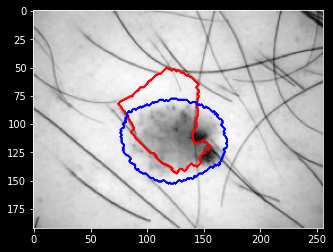

The dice similarity is  0.6125218464069087


In [14]:
#NB: ce resultat peut servir d'initialisation pour une autre methode de segmentation (croissance de regions, segmentation markovienne, etc.)
#superposition des contours de la segmentation a l'image initiale
plt.figure()
plt.imshow(imbr, cmap='gray')
plt.contour(morphology.opening(segm, morphology.disk(1)),
            colors='red',
            linewidths=1)
plt.contour(morphology.opening(im_Seg_r_bool, morphology.disk(1)),
            colors='blue',
            linewidths=1)

plt.show()

print('The dice similarity is ',
      1 - dice(segm.flatten(), im_Seg_r_bool.flatten()))

## We could also use the values of the morphological gradient to find the markers

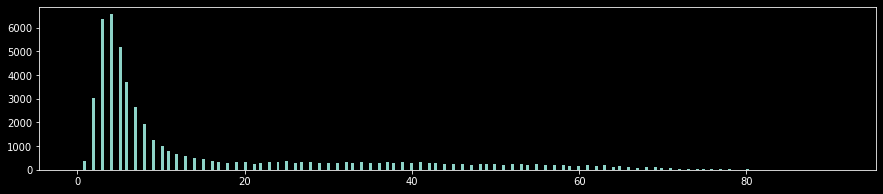

In [15]:
plt.figure(figsize=(15, 3))
plt.hist(grad.flatten(), bins=256)
plt.show()

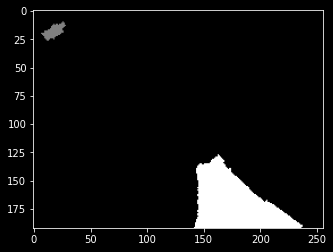

1


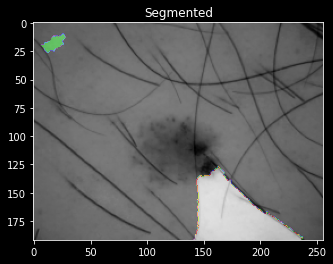

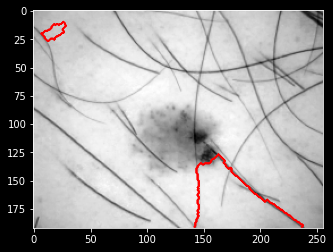

The dice similarity is  0.20410481375582623


In [16]:
markers = grad < 1
markers = ndi.label(markers)[0]

labels = watershed(grad, markers)

plt.figure()
plt.imshow(labels, cmap='gray')
plt.show()

plt.figure()
plt.imshow(imbr, cmap=plt.cm.gray)
plt.imshow(labels, cmap=plt.cm.nipy_spectral, alpha=.5)
plt.title("Segmented")

#%% visualiation du resultat
values, counts = np.unique(labels, return_counts=True)
print(values[np.argmax(counts)])
segm = labels.copy()
# Choose the greatest area
index = values[np.argmax(counts)]
segm = segm == index
#NB: ce resultat peut servir d'initialisation pour une autre methode de segmentation (croissance de regions, segmentation markovienne, etc.)

#superposition des contours de la segmentation a l'image initiale
plt.figure()
plt.imshow(imbr, cmap='gray')
plt.contour(morphology.opening(segm, morphology.disk(1)),
            colors='red',
            linewidths=1)
plt.show()

print('The dice similarity is ',
      1 - dice(segm.flatten(), im_Seg_r_bool.flatten()))

## DullRazor (OPTIONAL)
As you can see, there are several hairs within and outside the skin lesion image. One would like to remove and restore the hair regions to effectively segment and analyze the lesions. 

One of the simplest algorithms for Hair Removal is DullRazor proposed by Lee et al. It consists of three steps: (1) identification of the hair using morphological closing operation; (2) replacement of the hair pixels with normal (close) skin pixels using bilinear interpolation; and (3) smoothing the final result with a median filter.

---

*T.K. Lee, V. Ng, R. Gallagher, A. Coldman, D. McLean, A Dullrazor, Software approach to hair removal from images, J. Comput. Biol. Med. 27 (1997) 533–543*


In the first part, authors propose to use (at least) three structuring element of type line with angles 0, 45 and 90. You can try to use more, if you think it would be useful. Then, a generalized grayscale closing image is obtained by taking the maximum response of the grayscale closing results at the previously specified
directions. Finally, a binary hair mask image is created by thresholding the absolute
difference between the original image and the generalized grayscale closing image. 

In [17]:
taille_selem = 8
s0 = strel("line", taille_selem, 0)
s90 = strel("line", taille_selem, 90)
s45 = strel("line", taille_selem, -45)

elements = [s0, s45, s90]

In [18]:
# 512x486, On se remet dans le même format que dans l'article DullRazor.
from skimage.transform import resize


def resize_im(im, im_segmented):

    im_resized = resize(im, (512, 486), anti_aliasing=True)
    im_segmented = resize(im_segmented, (512, 486), anti_aliasing=False)
    (l, c, k) = np.shape(im_resized)
    im_r = im_resized[:, :, 0]
    im_g = im_resized[:, :, 1]
    im_b = im_resized[:, :, 2]

    return im_r, im_g, im_b, im_resized, im_segmented

In [19]:
def gclosing(im, elements):
    ''' Réalise la fermeture morphologique selon chacun des élements structurants'''
    im_s0 = morpho.closing(im, elements[0])
    im_s45 = morpho.closing(im, elements[1])
    im_s90 = morpho.closing(im, elements[2])
    return (im_s0, im_s45, im_s90)


def gclosing_application(im_r, im_g, im_b, elements):
    ''' On réalise la fermeture selon chacun des éléments structurants sur chaque canal'''
    im_rs0, im_rs45, im_rs90 = gclosing(im_r, elements)
    im_gs0, im_gs45, im_gs90 = gclosing(im_g, elements)
    im_bs0, im_bs45, im_bs90 = gclosing(im_b, elements)
    return im_rs0, im_rs45, im_rs90, im_gs0, im_gs45, im_gs90, im_bs0, im_bs45, im_bs90


def tripleMaxTab(im_bs0, im_bs45, im_bs90):
    out = np.maximum(im_bs0, np.maximum(im_bs45, im_bs90))
    return out


def tripleMaxTab_application(im_r, im_g, im_b, im_rs0, im_rs45, im_rs90,
                             im_gs0, im_gs45, im_gs90, im_bs0, im_bs45,
                             im_bs90):
    ''' On applique la formule (1) de l'article DullRazor'''
    gr = np.abs(im_r - tripleMaxTab(im_rs0, im_rs45, im_rs90))
    gg = np.abs(im_g - tripleMaxTab(im_gs0, im_gs45, im_gs90))
    gb = np.abs(im_b - tripleMaxTab(im_bs0, im_bs45, im_bs90))
    return gr, gg, gb

In [20]:
def calcul_masque_poils(gr, gg, gb):
    '''Formule (2) et (3) de l'article avec une valeur du seuil adapté à la plage des valeurs'''
    t = 0.0941176470588235294117647058823  # On rapporte la valeur de 24/255 du papier à [0;1]

    mr = np.where(gr >= t, 1, 0)
    mg = np.where(gg >= t, 1, 0)
    mb = np.where(gb >= t, 1, 0)
    mbol = (mr == 1) | (mg == 1) | (mb == 1)
    m = mbol.astype(int)
    return m

In [21]:
def affichage_masque_poils(m, im_resized):
    mAndImage = np.copy(im_resized)
    (l, w, c) = np.shape(im_resized)
    for i in range(l):
        for j in range(w):
            if m[i][j]: mAndImage[i, j] = [0, 0, 255]

    #mAndImage[m == 1 ] =[0,0,255]

    f = plt.figure(figsize=(12, 15))
    f.add_subplot(1, 3, 1)
    plt.imshow(m, cmap='gray')
    plt.title("Masque")
    plt.axis('off')
    f.add_subplot(1, 3, 2)
    plt.imshow(im_resized)
    plt.axis('off')
    plt.title("Image de base")
    f.add_subplot(1, 3, 3)
    plt.imshow(mAndImage)
    plt.title("Image + masque")
    plt.axis('off')
    plt.show()

In [22]:
def calcul_complet_masque(im, im_segmented, affichage=0):
    im_r, im_g, im_b, im_resized, im_seg_resized = resize_im(im, im_segmented)
    #im_resized = im
    #im_r, im_g, im_b = im[:,:,0], im[:,:,1], im[:,:,2]
    im_rs0, im_rs45, im_rs90, im_gs0, im_gs45, im_gs90, im_bs0, im_bs45, im_bs90 = gclosing_application(
        im_r, im_g, im_b, elements)
    gr, gg, gb = tripleMaxTab_application(im_r, im_g, im_b, im_rs0, im_rs45,
                                          im_rs90, im_gs0, im_gs45, im_gs90,
                                          im_bs0, im_bs45, im_bs90)
    m = calcul_masque_poils(gr, gg, gb)
    if affichage: affichage_masque_poils(m, im_resized)
    return m, im_resized, im_seg_resized

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


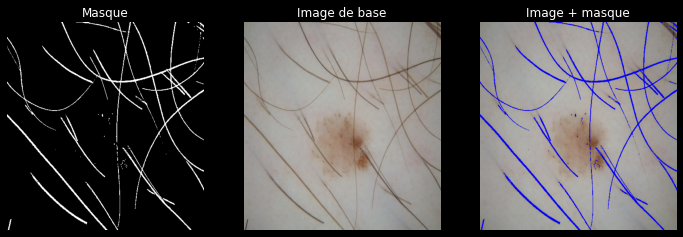

(768, 1024, 3)


In [23]:
mask, im_resized, im_seg = calcul_complet_masque(im,
                                                 im_Seg_r_bool,
                                                 affichage=1)
print(im.shape)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


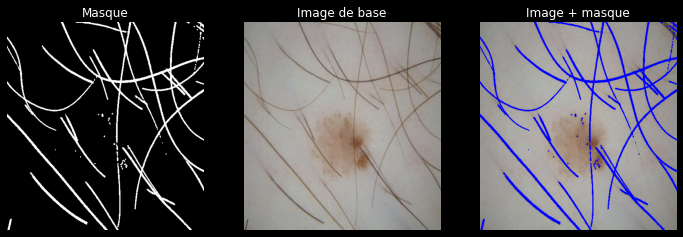

In [24]:
mask = morpho.dilation(mask, strel("disk", 1))
affichage_masque_poils(mask, im_resized)

Once computed the binary mask, we need to check whether each pixel of the mask is actually located within a thin and long structure, i.e. the hair structure; otherwise, it is rejected as noise.

For each pixel inside the hair region of the mask, line segments are drawn in eight directions: up, down,. left, right and the four diagonals, radiating from the pixel until the segment reaches the non-hair region. These eight line segments form four straight lines centering at the pixel. Lengths of the lines are calculated and the longest one is noted. The longest line must be longer than a certain amount of pixels (to be chosen) and the other lines must be shorter than a certain amount of pixels (to be chosen). Otherwise, the pixel is rejected.

When a pixel is verified to be inside the hair structure, its corresponding pixel in the
original image is replaced, using bilinear interpolation, by other nearby non-hair pixel values along the perpendicular line to the longest one (the direction supposed to be the hair). Please choose carefully the pixels along the perpendicualar direction since there might be other hairs nearby (look at the intensity value and check whether it might be a skin pixel). 

Instead than using a bilinear interpolation, we could also use a more advanced solution based on inpaiting (you will see it in IMA206) such as: 

Interpolation :

In [25]:
def mean_square(importion, m, size):
    res = 0
    pixel_count = 0
    for i in range(size):
        for j in range(size):
            if not (m[i, j]):
                res += importion[i, j]
                pixel_count += 1
    if pixel_count == 0: return 0
    else: res /= pixel_count
    return res


def interpolation_moy(im, m, size=20):
    res = np.copy(im)
    (l, w, c) = np.shape(im)
    for i in range(l):
        for j in range(w):
            if m[i, j]:
                try:
                    centered_square = im[i - size // 2:i + size // 2,
                                         j - size // 2:j + size // 2]
                    msquare = m[i - size // 2:i + size // 2,
                                j - size // 2:j + size // 2]
                    res[i, j] = mean_square(centered_square, msquare, size)
                except IndexError:
                    pass
                except ValueError:
                    pass
    return res

In [26]:
image_result = interpolation_moy(im_resized, mask)

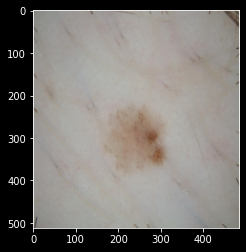

In [27]:
plt.imshow(image_result)
plt.show()

**Question (OPTIONAL)**: Implement the original (or a modified version) of the DullRazor algorithm. If you modify the algorithm, please explain why. 

**Answer** J'ai implémenté presque exactement l'algorithme sauf pour la partie finale sur le nettoyage du masque. Les techniques d'interpolation sur les directions normales à la direction du poil ne sont pas très efficaces et donne de mauvais résultats visuellement parlant.De même je ne suis pas très satisfait par l'inpainting. On va préférer simplement passer un filtre moyenneur sur les pixels du masque qui ne prend pas en compte le masque dans la moyenne.

## My pipeline

J'ai déjà travaillé sur cette problématique en IMA201 sur le projet du début d'année. On avait choisi de procéder en appliquant Dull Razor puis une méthode d'Otsu modifiée de sorte à considérer la peau saine. Ainsi j'essaie une méthode différente, qui en l'occurence fonctionne moins bien.

Tout d'abord on pré-traite toutes les images en appliquant DullRazor puis l'interpolation par moyennage. Ensuite on va utiliser le résultat obtenu en appliquant un watershedding sur le gradient morphologique à partir des minima locaux. Il s'agit de considérer la région la plus au centre comme la région de la lésion. On va ensuite itérativement fusionner toutes les régions tel que la différence de la moyenne de l'intensité de cette région et du masque de segmentation courrant soit inférieur à un certain seuil.

Sur les lésions les plus simples cette méthode fonctionne bien, aussi bien qualitativement que quantitativement (coefficient de Dice). Cependant sur les lésions assez peu contrastées par rapport à la peau saine, ou qui occupent un part trop importante de l'image, les résulats sont nettement moins probants, et ce pour deux raisons. D'une part les régions déterminées par le watershedding vont avoir des intensité trop proches pour être distinguées correctement, soit on va toutes les prendre, soit aucunes. D'autre part, le watershedding en lui même va avoir du mal à trouver des minimas locaux significatifs et donc les régions déterminées ne seront pas ou peu représentative de l'image. Pour y remédier on pourrait essayer de modifier les hyper-paramètres qui permettent d'obtenir les minimas locaux mais je n'ai pas réussi à obtenir d'amélioration significative.

Il appararait donc que les autres méthodes que j'ai finalement développées plus bas sont plus pertinentes. On pourra constater quantitativement ce fait sur le graphique final qui résume les résultats de toutes les méthodes mises en oeuvre.

### Préprocessing

In [28]:
def getImage(k):
    # Choose a figure and plot it with the ground truth segmentation
    indexIm = k
    filename = listImages[indexIm]
    im = imread(filename)
    filename_Segmentation = filename[:-4] + '_Segmentation.png'
    im_Seg = imread(filename_Segmentation)  # Value 0 or 255
    im_Seg_bool = im_Seg == 255
    return im, im_Seg_bool

In [29]:
def preProcess(im, im_Seg_r_bool):
    # Applique l'algorithme du DullRazor
    m, im_resized, im_Seg_r_bool_resized = calcul_complet_masque(im,
                                                                 im_Seg_r_bool,
                                                                 affichage=0)
    m = morpho.dilation(m, strel("disk", 1))
    im_resized = interpolation_moy(im_resized, m)
    return im_resized, im_Seg_r_bool_resized

In [30]:
# Loading and pre-processing all images
number_image = 13
im_tab = {}
imbr_tab = {}
im_Seg_r_bool_tab = {}
for k in range(number_image):
    im_tab[k], im_Seg_r_bool_tab[k] = getImage(k)
    print("Processing image ", k)
    im_tab[k], im_Seg_r_bool_tab[k] = preProcess(im_tab[k],
                                                 im_Seg_r_bool_tab[k])
    im_tab[k] = np.uint8(255 * im_tab[k])
    #imbr_tab[k] = im_tab[k][:,:,0] * 0.299 + im_tab[k][:,:,1] * 0.587 + im_tab[k][:,:,2] * 0.114
    imbr_tab[k] = im_tab[k][:, :, 2]  # On ne considère que le canal Bleu.

Processing image  0
Processing image  1
Processing image  2
Processing image  3
Processing image  4
Processing image  5
Processing image  6
Processing image  7
Processing image  8
Processing image  9
Processing image  10
Processing image  11
Processing image  12


### Processing

In [31]:
def segmentation(im, im_Seg_r_bool, tau=25, show_plot=0, im_ori=None):
    sizeDisque0 = 3
    sizeDisque1 = 2
    disk = strel('disk', sizeDisque0)
    closeDisk = morpho.closing(im, disk)
    se = strel('disk', sizeDisque1)
    Open = morpho.opening(closeDisk, se)
    grad = morpho.dilation(im, se) - morpho.erosion(im, se)

    maxIm = 255
    temp = Open.copy()

    for i in range(Open.shape[0]):
        for j in range(Open.shape[1]):
            if Open[i, j] < maxIm:
                temp[i, j] = Open[i, j] + 1
    reco = maxIm - morpho.reconstruction(maxIm - temp, maxIm - Open)
    minReg = np.uint8(reco) - Open

    #suppression des marqueurs trop petits
    tailleMin = 1
    seM = strel('disk', tailleMin)
    minReg = morpho.opening(minReg, seM)

    #ajout d'un marqueur sur le bord de l'image
    for i in range(minReg.shape[0]):
        minReg[i, 0] = 1
        minReg[i, minReg.shape[1] - 1] = 1
    for j in range(minReg.shape[1]):
        minReg[0, j] = 1
        minReg[minReg.shape[0] - 1, j] = 1

    #Any non-zero values in input are counted as features and zero values are considered the background.
    markers = ndi.label(minReg)[0]

    # We use the watershed algorithm to compute the labels
    labels = watershed(grad, markers)

    segm = labels.copy()
    # Choose the area of the center
    # On considère que la région au centre est toujours incluse dans la lésion
    index = labels[labels.shape[0] // 2, labels.shape[1] // 2]
    segm = segm == index

    index_mean = np.mean(im[segm])

    imb = np.copy(im)
    #Region merging
    for k in range(2, labels.max()):
        if k != index:
            k_zone = labels == k
            k_mean = im[k_zone].mean()

            if abs(k_mean - index_mean) < tau:
                segm = np.logical_or(segm, k_zone)

        #Averaged image by region
        imb[labels == k] = imb[labels == k].mean()

    dice_similarity = 1 - dice(segm.flatten(), im_Seg_r_bool.flatten())

    if show_plot:
        print('The dice similarity is ', dice_similarity)

        fig = plt.figure(figsize=(10, 10))
        grid = AxesGrid(fig, 111, nrows_ncols=(1, 4), axes_pad=0.5)
        grid[0].imshow(labels)
        grid[0].axis('off')
        grid[0].set_title("Labels du watershed")
        grid[1].imshow(imb, cmap='gray')
        grid[1].axis('off')
        grid[1].set_title("Averaged image by region")
        grid[2].imshow(im, cmap='gray')
        grid[2].contour(morphology.opening(segm, morphology.disk(1)),
                        colors='red',
                        linewidths=1)
        grid[2].contour(morphology.opening(im_Seg_r_bool, morphology.disk(1)),
                        colors='blue',
                        linewidths=1)
        grid[2].axis('off')
        grid[2].set_title("Segmentation résult")
        grid[3].imshow(im_ori)
        grid[3].set_title("Original image")
        grid[3].axis('off')

        plt.show()

    return segm, dice_similarity

#### Hyperparameters optimisation

In [32]:
# Hyper parameters optimisation
tau_tab = [k for k in range(40, 110, 5)]
dice_tab = []
print(f" tau ranging from {tau_tab[0]} to {tau_tab[-1]}")
for tau_train in tau_tab:
    print(tau_train, end=', ')
    avg_dice = 0
    for k in range(number_image):
        #print(k,end='| ')
        _, dice_similarity = segmentation(imbr_tab[k],
                                          im_Seg_r_bool_tab[k],
                                          tau=tau_train,
                                          show_plot=0)
        avg_dice += dice_similarity
    #print()
    avg_dice /= number_image
    dice_tab.append(avg_dice)

 tau ranging from 40 to 105
40, 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100, 105, 

best_tau = 85


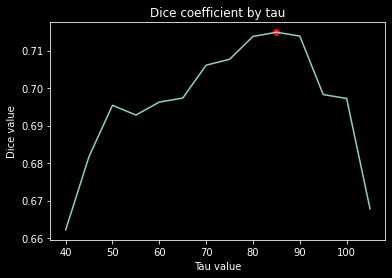

In [33]:
best_tau = tau_tab[np.argmax(dice_tab)]
print(f"{best_tau = }")

plt.plot(tau_tab, dice_tab)
plt.scatter(best_tau, np.max(dice_tab), c='r')
plt.title("Dice coefficient by tau")
plt.xlabel("Tau value")
plt.ylabel("Dice value")
plt.show()

#### Result

The dice similarity is  0.8016551572947496


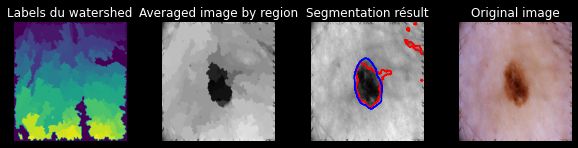

The dice similarity is  0.2576183086926306


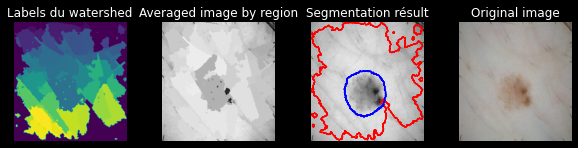

The dice similarity is  0.9277750137474142


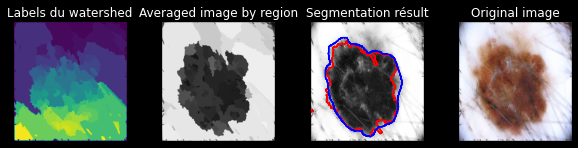

The dice similarity is  0.8296751275348135


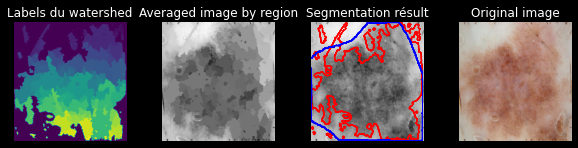

The dice similarity is  0.6698340277646853


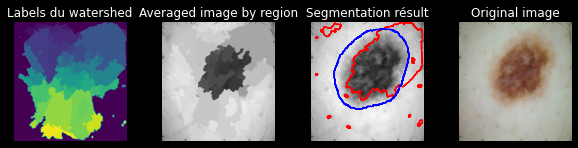

The dice similarity is  0.22489332186067745


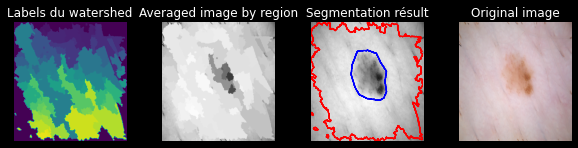

The dice similarity is  0.5572538049282574


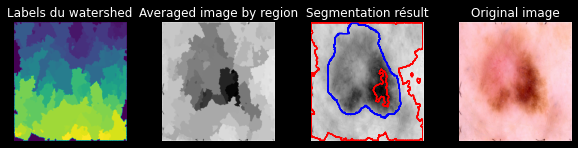

The dice similarity is  0.9587096384450419


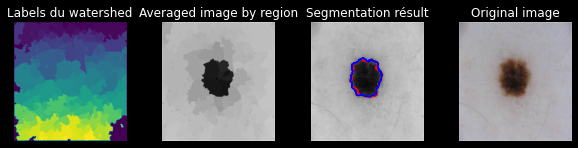

The dice similarity is  0.8634114740911065


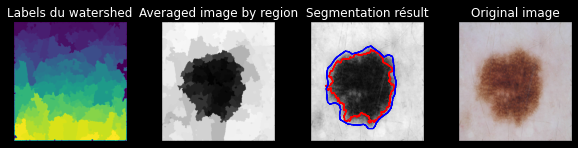

The dice similarity is  0.7300005341839577


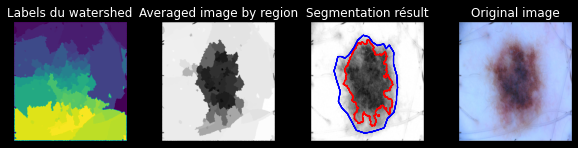

The dice similarity is  0.9108397586507385


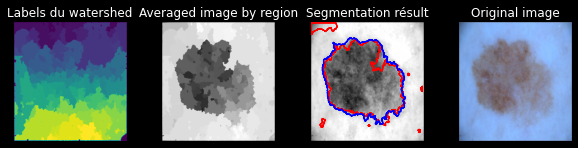

The dice similarity is  0.7985521445678205


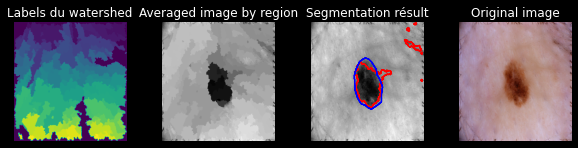

The dice similarity is  0.7633480057793757


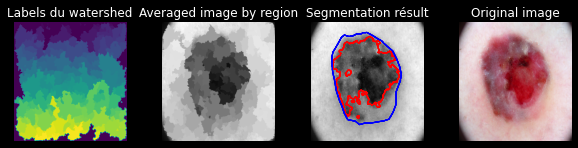

In [34]:
dice_tab_morpho = [k for k in range(number_image)]
for k in range(number_image):
    _, dice_tab_morpho[k] = segmentation(imbr_tab[k],
                                         im_Seg_r_bool_tab[k],
                                         tau=best_tau,
                                         show_plot=1,
                                         im_ori=im_tab[k])

## KMeans on processed data

In [35]:
def kmeans_segmentation(imbr,im_Seg_r_bool, Ncluster=3, show_plot = 0):

    x, y = imbr.shape
    imFloat = np.array(imbr, dtype=np.float64) / 255 # transform into float for computational reason
    kmeans = KMeans(n_clusters=Ncluster) # use K-means algorithm 
    kmeansSeg=kmeans.fit_predict(imFloat.reshape(-1,1)) # fit to the data reshaped as a 1D vector
    kmeansSeg=np.reshape(kmeansSeg,(x,y)) # reshape as the initial image



    mean_x, mean_y = x//2,y//2 # Milieu de l'image
    search_zone = 10
    kmeans_Seg_center = kmeansSeg[mean_x - search_zone : mean_x + search_zone, mean_y - search_zone :mean_y + search_zone]

    index_lesion = 0 #Index de la région majoritaire
    nb_pixel_class = 0 #Nombre de pixel de la région majoritaire
    for k in range(Ncluster) :
        pixel_k = np.sum(kmeans_Seg_center == k)
        if pixel_k > nb_pixel_class :
            index_lesion = k
            nb_pixel_class = pixel_k


    kmeansSeg_bool = kmeansSeg==index_lesion
    dice_similarity = 1-dice(kmeansSeg_bool.flatten(),im_Seg_r_bool.flatten())

    if show_plot :
        print('The dice similarity is ', dice_similarity)
        fig = plt.figure(figsize=(12, 12))
        grid = AxesGrid(fig, 111,
                        nrows_ncols = (1, 5),
                        axes_pad = 0.5)
        grid[0].imshow(imbr,cmap='gray')
        grid[0].contour(morphology.opening(kmeansSeg_bool, morphology.disk(1)), colors='green', linewidths=1)
        #grid[0].axis('off')
        grid[0].set_title("Computed segmentation")
        grid[1].imshow(imbr,cmap='gray')
        grid[1].contour(morphology.opening(im_Seg_r_bool, morphology.disk(1)), colors='red', linewidths=1)
        grid[1].axis('off')
        grid[1].set_title("Ground Truth segmentation")
        grid[2].imshow(imbr,cmap='gray')
        grid[2].contour(morphology.opening(im_Seg_r_bool, morphology.disk(1)), colors='red', linewidths=1)
        grid[2].contour(morphology.opening(kmeansSeg_bool, morphology.disk(1)), colors='green', linewidths=1)
        grid[2].axis('off')
        grid[2].set_title("Comparison")
        grid[3].imshow(kmeansSeg)
        grid[3].axis('off')
        grid[3].set_title("Clustering result")
        grid[4].imshow(kmeansSeg_bool,cmap='gray')
        grid[4].axis('off')
        grid[4].set_title("Segmentation mask result")
        plt.show()
        
    return kmeansSeg_bool, dice_similarity
    

### Number of cluster optimization

In [36]:
Nmax = 5
dice_result = np.array([0. for k in range(1,Nmax+1)])
Ncluster_tab = [ k for k in range(1,Nmax+1)]
print("We try values ranging from 1 to",Nmax)
print("Ncluster = ")
for Ncluster in Ncluster_tab:
    print(Ncluster,end=', ')
    dice_tab_kmeans = np.array([0. for k in range(number_image)])
    for k in range(number_image):
        _, dice_tab_kmeans[k] = kmeans_segmentation(imbr_tab[k],im_Seg_r_bool_tab[k],Ncluster = Ncluster , show_plot =0 )
    dice_result[Ncluster-1] = dice_tab_kmeans.mean()

We try values ranging from 1 to 5
Ncluster = 
1, 2, 3, 4, 5, 

The best number of cluster is 2


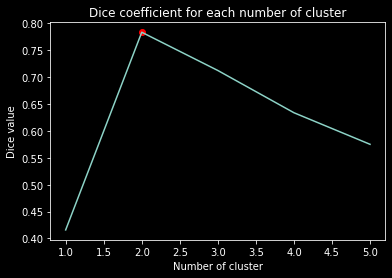

array([0.41585346, 0.78348233, 0.71233203, 0.6337917 , 0.5750647 ])

In [37]:
best_Ncluster = np.argmax(dice_result)+1
print("The best number of cluster is",best_Ncluster)

plt.plot(Ncluster_tab,dice_result)
plt.scatter(best_Ncluster,dice_result[best_Ncluster-1],c='r')
plt.title("Dice coefficient for each number of cluster")
plt.xlabel("Number of cluster")
plt.ylabel("Dice value")
plt.show()

dice_result

### Results

The dice similarity is  0.8475715203320322


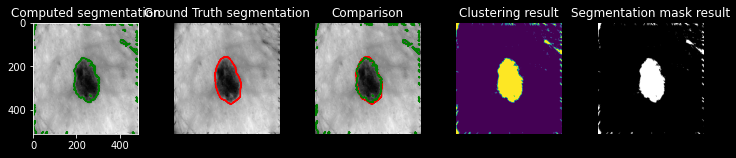

The dice similarity is  0.3992224134081147


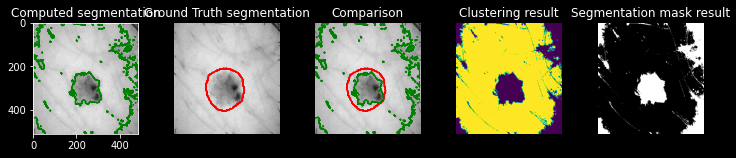

The dice similarity is  0.9186730951990009


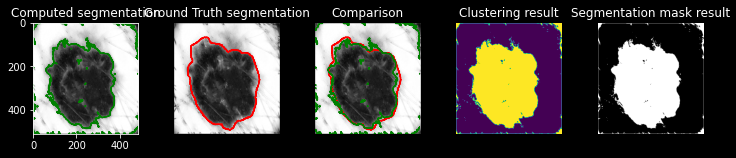

The dice similarity is  0.8449426178189531


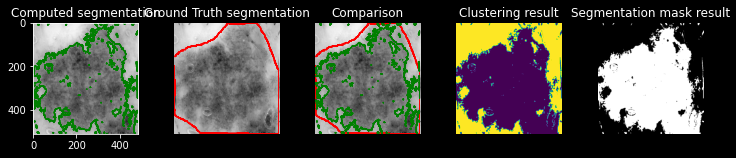

The dice similarity is  0.6926442947036842


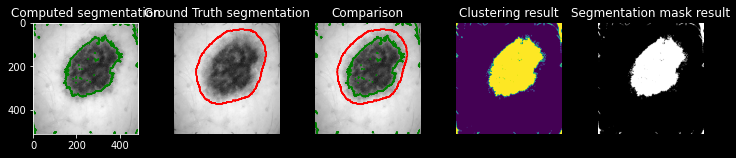

The dice similarity is  0.32648576727683254


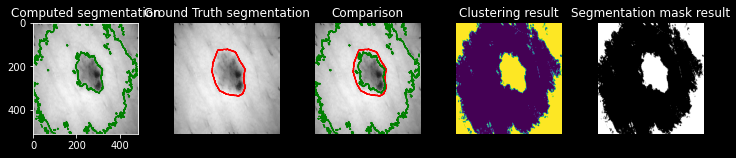

The dice similarity is  0.8558159094141728


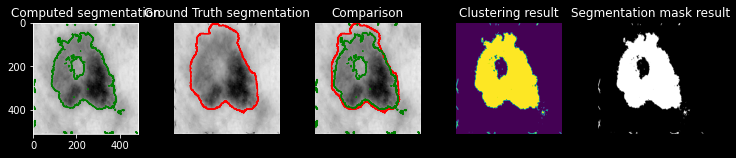

The dice similarity is  0.9597254523796018


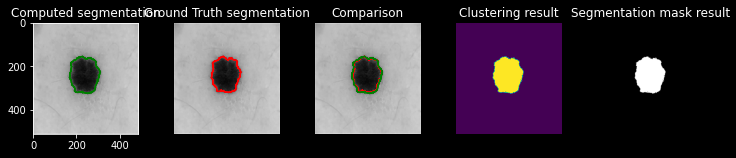

The dice similarity is  0.8986899739609616


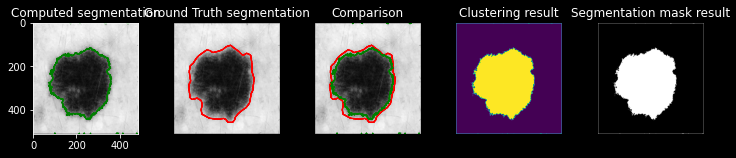

The dice similarity is  0.8188588980401751


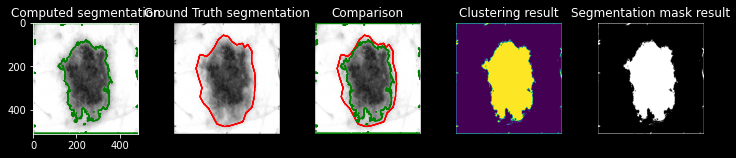

The dice similarity is  0.8964784558437056


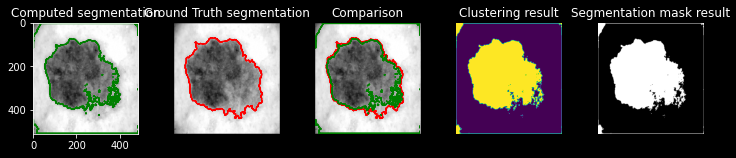

The dice similarity is  0.8456665848269089


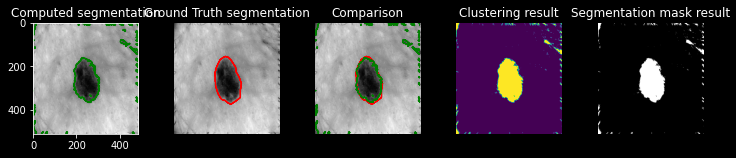

The dice similarity is  0.8804953064794594


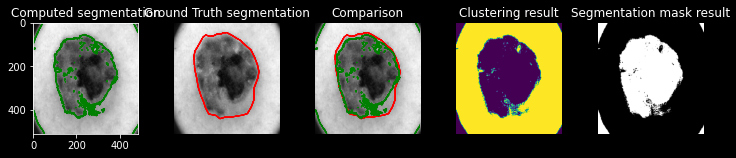

In [38]:
dice_tab_kmeans = np.array([0. for k in range(number_image)])
for k in range(number_image):
    _, dice_tab_kmeans[k] = kmeans_segmentation(imbr_tab[k],im_Seg_r_bool_tab[k],Ncluster = best_Ncluster , show_plot =1 )

## Otsu's algorithm

Otsu's method looks for a threshold to split a gray-level image into two separate regions, based on their grey-level values. Since the maximum number of grey-levels is finite (and small, 256), we can use an exhaustive search.

The grey-level threshold is the one that minimises the intra-class intensity variance, defined as a weighted sum of the variances of the two regions :

$argmin_{\tau}  \omega_0(\tau)\sigma_0^2(\tau) + \omega_1(\tau)\sigma_1^2(t)$

Otsu showed that it is equivalent to finding 
$ argmax_{\tau} \omega_1(\tau) \omega_2(\tau) [\mu_1(\tau) - \mu_2(\tau)]² )$

where

- $\sigma_0^2(\tau)$ and $\sigma_1^2(\tau)$ are the intensity variances of the pixels in the first and second regions
- $\omega_0(\tau)$ and $\omega_1(\tau)$ are the weights of the first and second regions 
- $\mu_1(\tau) $ and  $\mu_2(\tau)$ are the average intensity of the pixels in each region.

Given the histogram of the image with $L$ bins where each bin $i$ has $p(i)$ pixels, we define the weights $\omega_0(\tau)$ and $\omega_1(\tau)$ as:

- $\omega_0(\tau) = \sum_{i=0}^{\tau -1} p(i)$
- $\omega_1(\tau) = \sum_{i = \tau}^{L-1} p(i)$


**Question**: Implement this algorithm in a function called ``segmentation_otsu``. Note : only analyse thresholds which produce two distinct regions. Furthemore, remember that the image has only 256 discrete values. Choose the threshold values accordingly.

In [39]:
def segmentation_otsu(img, show_plots = 0):
    
    max_sigma = 0
    tau_out = 0
    min_level = 0.0
    max_level = 255.0
    n_levels = 256
    
    
    hist, bins = np.histogram(img.flatten(),bins = np.arange(0,256))
    bins = bins[:-1]
    
    tab_sigma = []
    tab_tau = np.linspace(min_level, max_level,n_levels)
    for tau in np.linspace(min_level, max_level,n_levels):
        # first, get weights of the two regions
        omega_0 = np.sum(hist[bins < tau])
        omega_1 = np.sum(hist[bins >= tau])

        # only analyse thresholds which give two non-empty regions
        if (omega_0 !=0 and omega_1 != 0):
            mu_0 = np.mean(hist[bins<tau])
            mu_1 = np.mean(hist[bins>=tau])

            sigma_total = omega_0 * omega_1 * (mu_0 - mu_1)**2
            tab_sigma = np.append(tab_sigma,sigma_total)
            if (sigma_total > max_sigma):
                tau_out = tau
                max_sigma = sigma_total
        else : tab_sigma = np.append(tab_sigma,0)
   
    if show_plots:
        plt.plot(tab_tau,tab_sigma)
        plt.scatter(tau_out,max_sigma,c='r')
        plt.title("Sigma en fonction de tau")
        plt.show()
        plt.hist(img.flatten(),bins = np.arange(0,256))    
        plt.plot(np.ones(np.max(hist))*tau_out,np.arange(0,np.max(hist)),c='r')
        plt.title("Histogramme")

    
    img_out = np.zeros((img.shape[0],img.shape[1]))
    img_out[img<tau_out] = 1
    
    return img_out,tau_out

You can apply the Otsu method to segment previously pre-processed images.

The best threshold is 129.0. The dice similarity is  0.5406907274376287


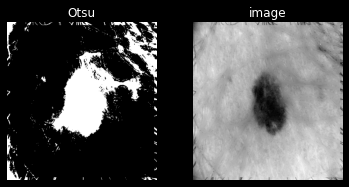

The best threshold is 143.0. The dice similarity is  0.3992224134081147


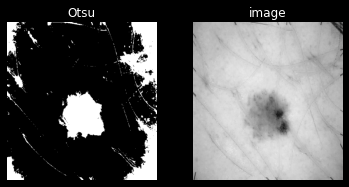

The best threshold is 254.0. The dice similarity is  0.6274729237388245


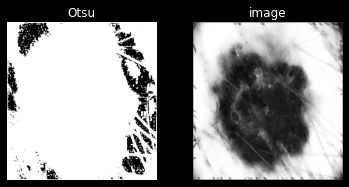

The best threshold is 89.0. The dice similarity is  0.266653357290211


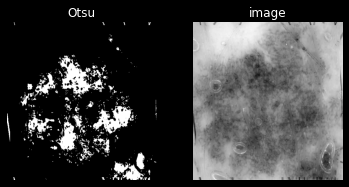

The best threshold is 133.0. The dice similarity is  0.7416848078828358


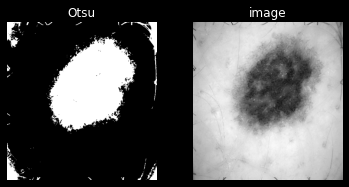

The best threshold is 168.0. The dice similarity is  0.34148964775477275


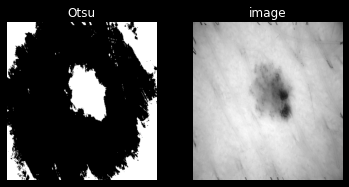

The best threshold is 171.0. The dice similarity is  0.9107930383772334


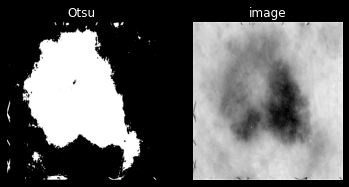

The best threshold is 168.0. The dice similarity is  0.4658046253418163


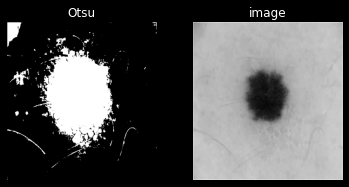

The best threshold is 177.0. The dice similarity is  0.8863515814745541


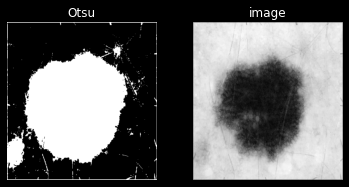

The best threshold is 254.0. The dice similarity is  0.6244587363886742


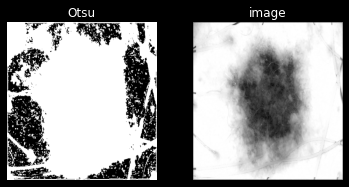

The best threshold is 254.0. The dice similarity is  0.567473335696089


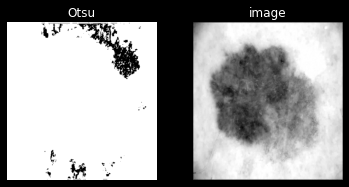

The best threshold is 129.0. The dice similarity is  0.5443878648784336


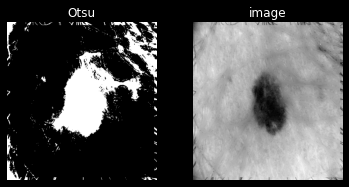

The best threshold is 175.0. The dice similarity is  0.8612044357394408


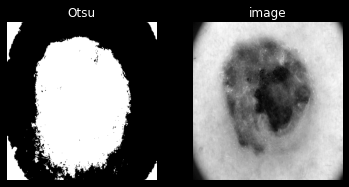

In [ ]:
dice_tab_otsu = [0 for k in range(number_image)]
for k in range(number_image):
    Otsu1,tau1 = segmentation_otsu(imbr_tab[k],show_plots=0)

    fig = plt.figure(figsize=(6, 6))
    grid = AxesGrid(fig, 111,
                    nrows_ncols = (1, 2),
                    axes_pad = 0.5)
    grid[0].imshow(Otsu1,cmap='gray')
    grid[0].axis('off')
    grid[0].set_title('Otsu')
    grid[1].imshow(imbr_tab[k],cmap='gray')
    grid[1].axis('off')
    grid[1].set_title("image")
    print('The best threshold is {}'.format(tau1), end='. ')
    dice_tab_otsu[k] = 1-dice(Otsu1.flatten(),im_Seg_r_bool_tab[k].flatten())
    print('The dice similarity is ',dice_tab_otsu[k] )
    plt.show()

One of the problem of the Otsu method it's that there is no notion of connectivity (two regions far away can be in the same region). For such a notion, we turn to region merging.

## Region merging

The region merging algorithm is quite simple : we start with a small region, and add pixels progressively to the region, according to a criterion. We choose the following criterion :

- A pixel $p$ is added to the region if the absolute difference between the pixel value and the region's average value is less than a threshold value (which you must set).

First, we can create a function called ``initialize_segmentation`` which initialises the segmentation with a small circular region centred on a given seed point (the seed point is an input). For this, the following function :

- scipy.ndimage.morphology.distance_transform_edt

can be useful.

In [41]:
from scipy.ndimage.morphology import distance_transform_edt


def initialize_segmentation(seed_pt, img_shape):
    seg_init = np.zeros(img_shape).astype(float)
    seg_init[seed_pt[0], seed_pt[1]] = 1
    dist = distance_transform_edt(np.abs(1 - seg_init))

    # initialise the seeded region with a certain radius
    size_radius = 2
    seg_init = dist < size_radius
    return seg_init

Now, we can create a function called ``segmentation_region_growing`` which carries out the region growing algorithm, with the criterion above, and which uses the ``initialize_segmentation`` function. Again, the functions from ``scipy.ndimage.morphology`` can be useful here.

In [42]:
from scipy.ndimage import binary_dilation


def segmentation_region_growing(img, seed_pt, tau):

    # define the neighbourhood (for instance 4-connected pixels)
    nbhood = np.asarray([[0, 1, 0], [1, 1, 1], [0, 1, 0]])

    seg_init = initialize_segmentation(seed_pt, img.shape)
    seg_n_plus_1 = seg_init
    seg_n = np.zeros(seg_n_plus_1.shape)

    # loop while the region can still keep growing
    ims = [seg_n]
    while (np.abs(seg_n_plus_1 != seg_n).sum() != 0):
        seg_n = seg_n_plus_1
        seg_n_plus_1 = binary_dilation(seg_n,
                                       structure=nbhood).astype(seg_n.dtype)
        # calculate average value
        avg = np.sum(img[seg_n > 0]) / (float(seg_n.sum()))
        seg_n_plus_1 = np.logical_and(seg_n_plus_1, np.abs(img - avg) < tau)
        # do not lose previous points of the segmentation
        seg_n_plus_1 = np.logical_or(seg_n_plus_1, seg_n)
        #ims.append(seg_n)
    return seg_n, seg_init, ims

**Question**: Carry out the segmentation on the skin lesion images with the seed point and threshold specified in the following code. The proposed implementation is very simple. We could definitely improve it. Do you see how ? You can simply explain how you would do it or, if you have time, even try to implement it. 

**Answer** Bien évidemment on devrait déjà essayer d'optimiser le paramètre de tolérance. Ensuite puisque les lésions sont toujours quasiment convexes, on pourrait rajouter une phase de post-traitement on l'on remplirait le masque obtenue avant de combler tous les trous.
Aussi on pourrait appliquer cette méthode non pas sur l'image de base mais sur un masque déjà obtenue précédemment ,par la méthode d'Otsu ou les KMeans par exemple. Cela permettrait en effet de ne garder qu'une composante connexe selon le point d'initialisation choisi. Dans ce cas le seuil sera 1.

### Region merging sur l'image de base

The dice similarity is  0.6034899919348926


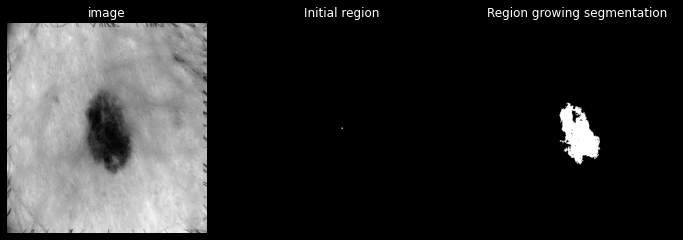

The dice similarity is  0.6779159696462773


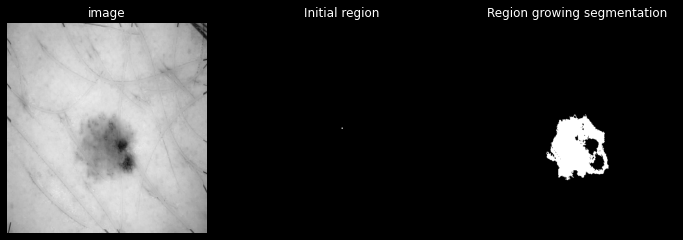

The dice similarity is  0.7475925742082796


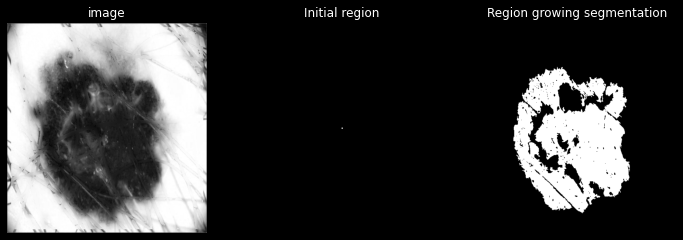

The dice similarity is  0.7025424283102492


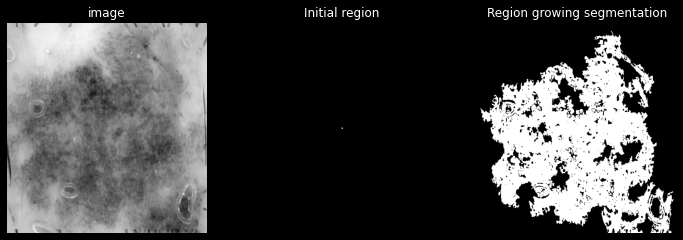

The dice similarity is  0.5342379652669553


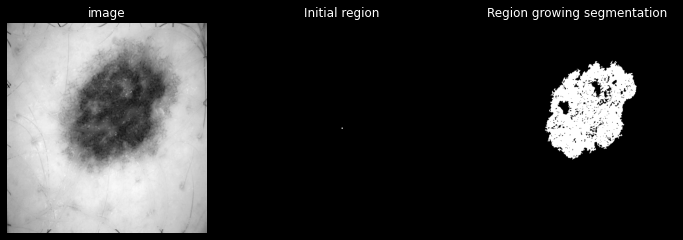

The dice similarity is  0.6243823845327605


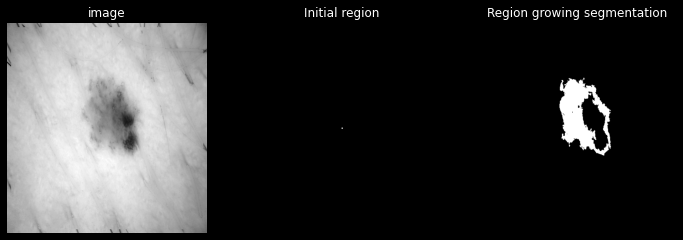

The dice similarity is  0.31141945330928267


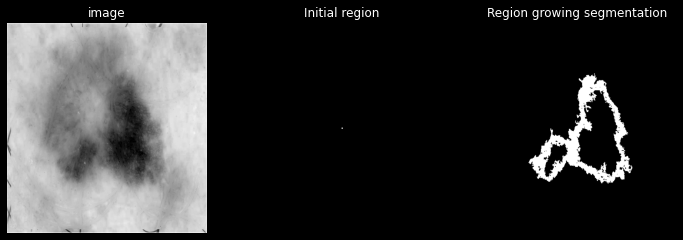

The dice similarity is  0.8589605493469772


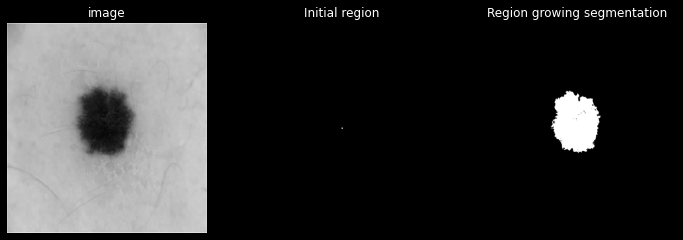

The dice similarity is  0.7444974119349916


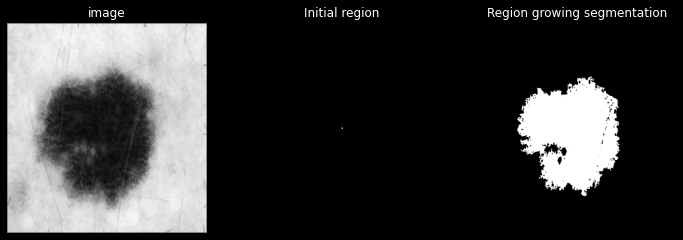

The dice similarity is  0.5144341492153608


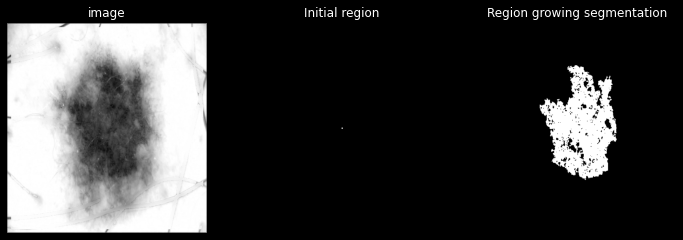

The dice similarity is  0.6453101159183438


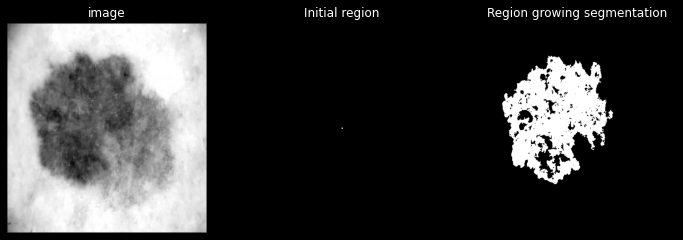

The dice similarity is  0.5979658554304395


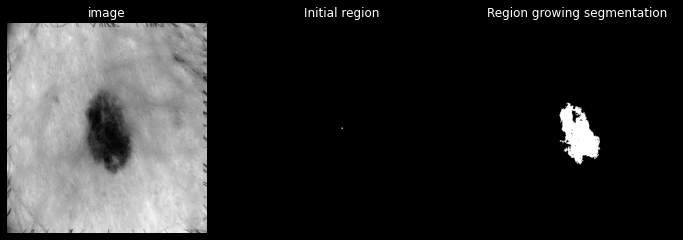

The dice similarity is  0.25169350624673414


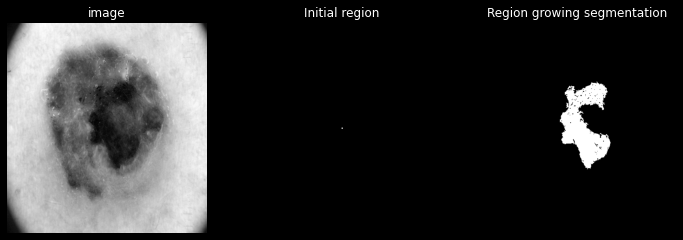

In [43]:
dice_tab_merge = [0 for k in range(number_image)]
for k in range(number_image):
    seed_pt = [imbr_tab[k].shape[0] // 2, imbr_tab[k].shape[1] // 2]
    tau = 21
    img_out_region_growing, seg_init, ims = segmentation_region_growing(
        imbr_tab[k], seed_pt, tau)

    fig = plt.figure(figsize=(12, 12))
    grid = AxesGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.5)
    grid[0].imshow(imbr_tab[k], cmap='gray')
    grid[0].axis('off')
    grid[0].set_title("image")
    grid[1].imshow(seg_init, cmap='gray')
    grid[1].axis('off')
    grid[1].set_title("Initial region")
    grid[2].imshow(img_out_region_growing, cmap='gray')
    grid[2].axis('off')
    grid[2].set_title("Region growing segmentation")

    dice_tab_merge[k] = 1 - dice(img_out_region_growing.flatten(),
                                 im_Seg_r_bool_tab[k].flatten())
    print('The dice similarity is ', dice_tab_merge[k])
    plt.show()

### Region merging sur le masque d'otsu

The dice similarity is  0.712567352204599


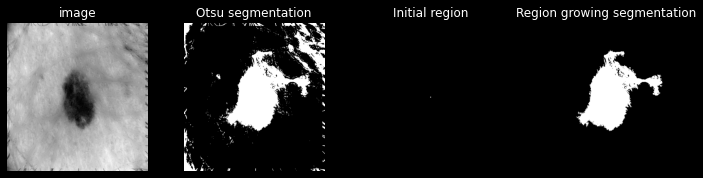

The dice similarity is  0.7122640395019728


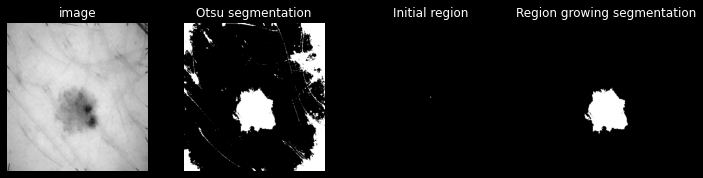

The dice similarity is  0.6320687657549046


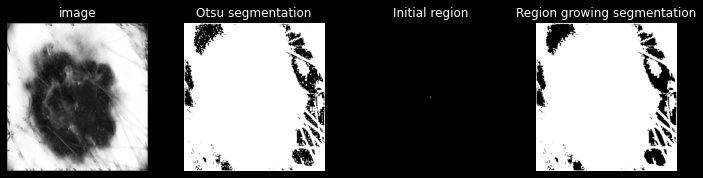

The dice similarity is  0.8234765159116294


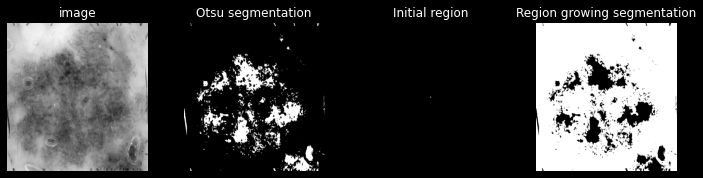

The dice similarity is  0.7804864071062717


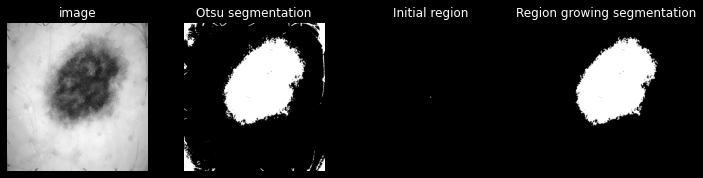

The dice similarity is  0.7392823743662942


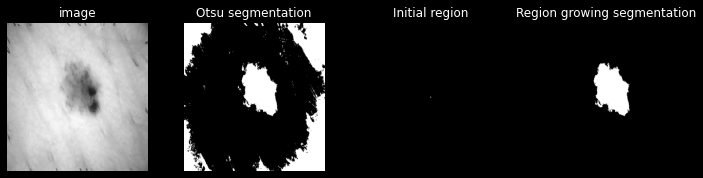

The dice similarity is  0.9255072246761997


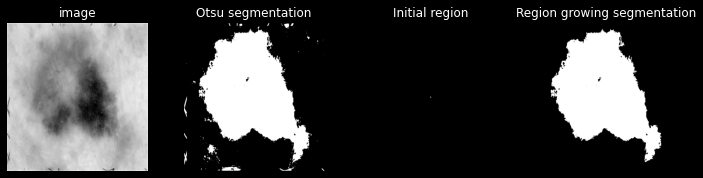

The dice similarity is  0.5134504695546804


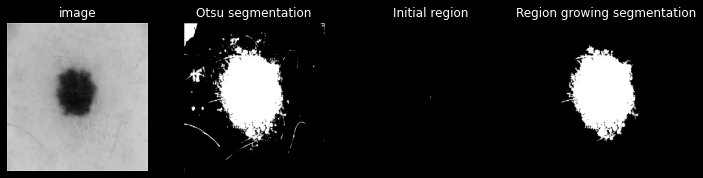

The dice similarity is  0.9445148545485919


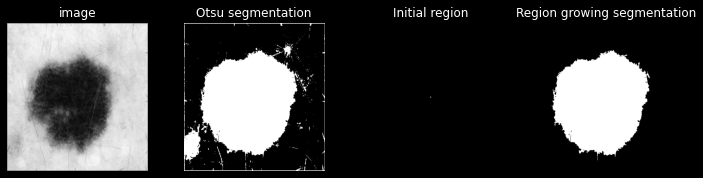

The dice similarity is  0.6478513564541055


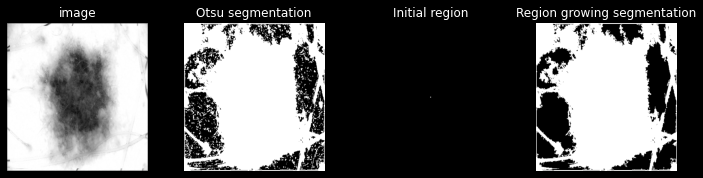

The dice similarity is  0.5702648649800461


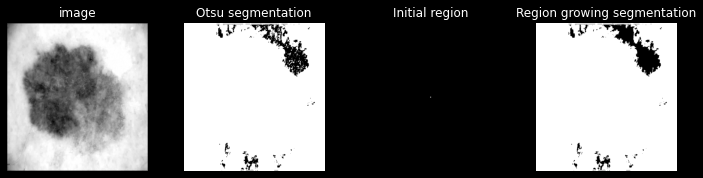

The dice similarity is  0.7166163141993958


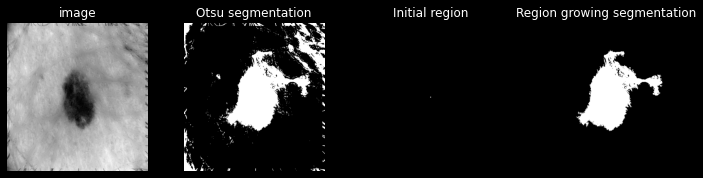

The dice similarity is  0.9072432041613528


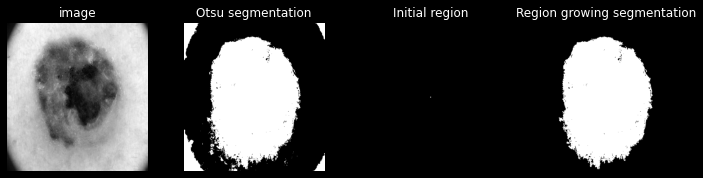

In [44]:
dice_tab_otsu_merged = [0 for k in range(number_image)]
for k in range(number_image):
    seed_pt = [imbr_tab[k].shape[0] // 2, imbr_tab[k].shape[1] // 2]
    tau = 1
    Otsu, tau_otsu = segmentation_otsu(imbr_tab[k], show_plots=0)
    img_out_region_growing, seg_init, ims = segmentation_region_growing(
        Otsu, seed_pt, tau)

    fig = plt.figure(figsize=(12, 12))
    grid = AxesGrid(fig, 111, nrows_ncols=(1, 4), axes_pad=0.5)
    grid[0].imshow(imbr_tab[k], cmap='gray')
    grid[0].axis('off')
    grid[0].set_title("image")
    grid[1].imshow(Otsu, cmap='gray')
    grid[1].axis('off')
    grid[1].set_title("Otsu segmentation")
    grid[2].imshow(seg_init, cmap='gray')
    grid[2].axis('off')
    grid[2].set_title("Initial region")
    grid[3].imshow(img_out_region_growing, cmap='gray')
    grid[3].axis('off')
    grid[3].set_title("Region growing segmentation")

    dice_tab_otsu_merged[k] = 1 - dice(img_out_region_growing.flatten(),
                                       im_Seg_r_bool_tab[k].flatten())

    print('The dice similarity is ', dice_tab_otsu_merged[k])
    plt.show()

###Region merging sur le masque de KMeans

The dice similarity is  0.9382439051084904


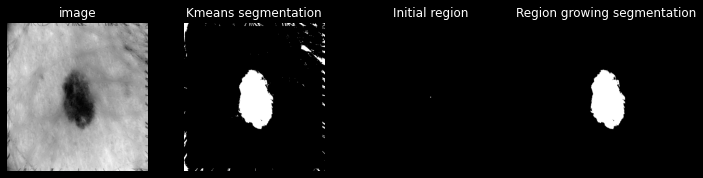

The dice similarity is  0.6973854022274271


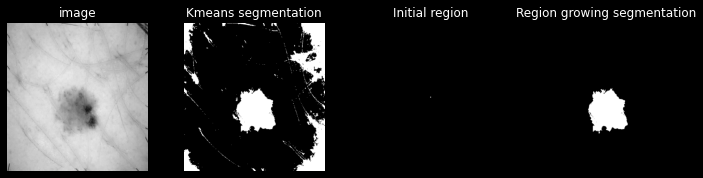

The dice similarity is  0.9468769081570346


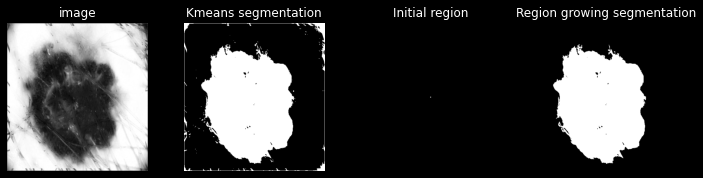

The dice similarity is  0.8396097555547519


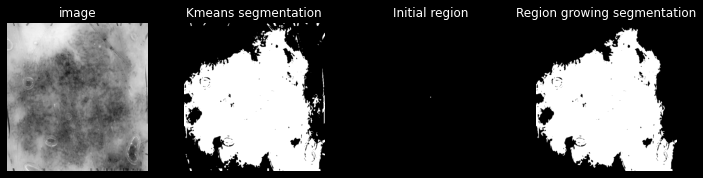

The dice similarity is  0.7025729354022499


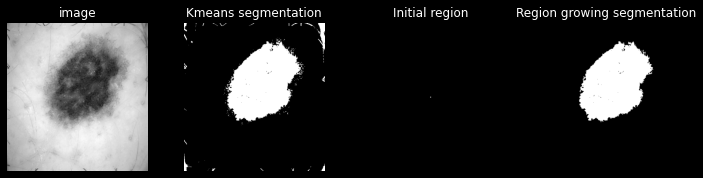

The dice similarity is  0.7705378356973145


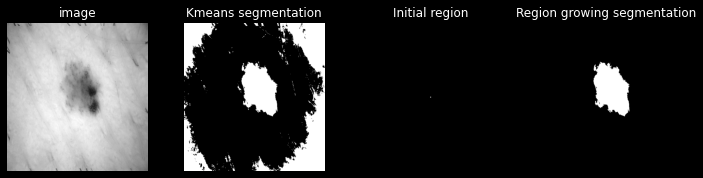

The dice similarity is  0.8594178680101761


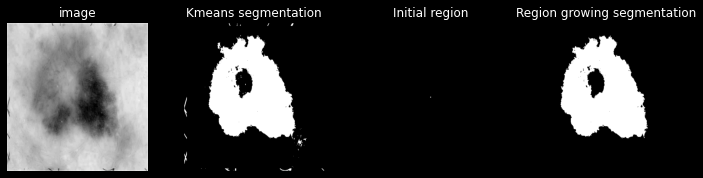

The dice similarity is  0.9599432624113475


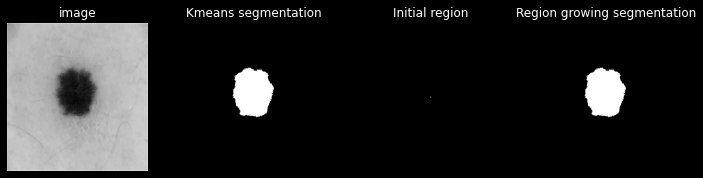

The dice similarity is  0.9104473536919989


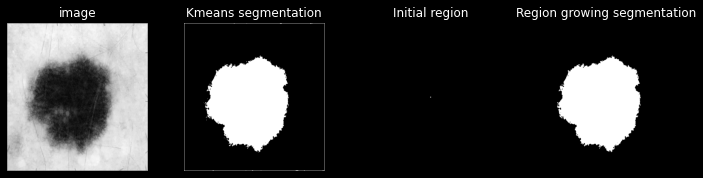

The dice similarity is  0.8373642955945844


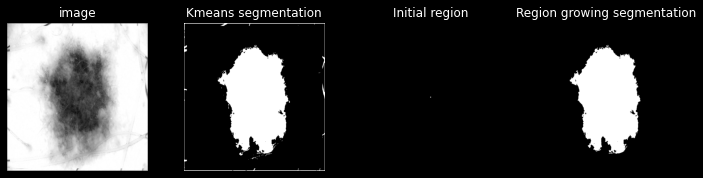

The dice similarity is  0.9201166718546444


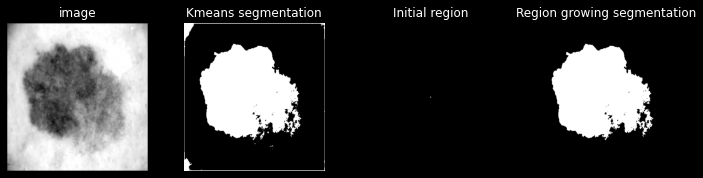

The dice similarity is  0.9355145520258703


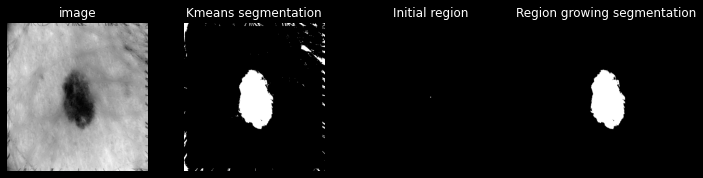

The dice similarity is  0.9063083682678226


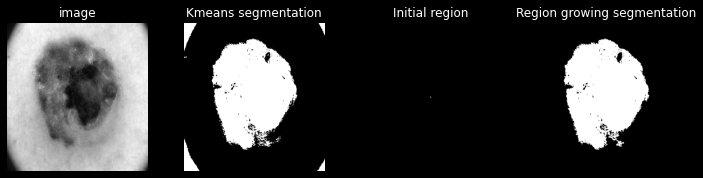

In [45]:
dice_tab_kmeans_merged = [0 for k in range(number_image)]
for k in range(number_image):
    seed_pt = [imbr_tab[k].shape[0] // 2, imbr_tab[k].shape[1] // 2]
    tau = 1
    kmeansSeg_bool, dice_tab_kmeans[k] = kmeans_segmentation(
        imbr_tab[k], im_Seg_r_bool_tab[k], Ncluster=best_Ncluster, show_plot=0)
    img_out_region_growing, seg_init, ims = segmentation_region_growing(
        kmeansSeg_bool, seed_pt, tau)

    dice_tab_kmeans_merged[k] = 1 - dice(img_out_region_growing.flatten(),
                                         im_Seg_r_bool_tab[k].flatten())
    print('The dice similarity is ', dice_tab_kmeans_merged[k])

    fig = plt.figure(figsize=(12, 12))
    grid = AxesGrid(fig, 111, nrows_ncols=(1, 4), axes_pad=0.5)
    grid[0].imshow(imbr_tab[k], cmap='gray')
    grid[0].axis('off')
    grid[0].set_title("image")
    grid[1].imshow(kmeansSeg_bool, cmap='gray')
    grid[1].axis('off')
    grid[1].set_title("Kmeans segmentation")
    grid[2].imshow(seg_init, cmap='gray')
    grid[2].axis('off')
    grid[2].set_title("Initial region")
    grid[3].imshow(img_out_region_growing, cmap='gray')
    grid[3].axis('off')
    grid[3].set_title("Region growing segmentation")
    plt.show()

## Graph-Cut
You can also use graph-cut, as seen in the previous lecture, to segment the image or to remove hair. You could, for instance, see the hair as noise and try to remove it using the gaussian model or the one of Potts.

Here, you can find an example of binary segmentation.

**Question**: propose a pipeline, based on graph-cuts and other pre-processing or post-processing methods, to correctly segment the images.

**Answer** : On considère des images déjà nettoyées des poils. On va alors vouloir faire un graph cut en considérant deux classes : la lésion et l'arrière plan. On utilise un modèle de Potts et on considère que les distributions de l'intensité des pixels de la lésion et de l'arrière-plan sont toutes deux gaussiennes, indépendantes, et de même variance. On détermine empiriquement leur moyenne respective en utilisant les vérités terrains. On pourrait aussi initialiser ces moyennes avec une des méthodes précédentes si on veut être indépendant des vérités terrains. On constate que globalement cela marche très mal. Soit $\beta$ est trop faible et le masque obtenue est trop morcelé, soit il est trop élevé et on va certes avoir la lésion mais aussi des grandes régions. On pourrait sans doute y remédier en appliquant d'abord cette méthode puis en éliminant les régions en trop. Et en comblant les trous dans la région centrale avec des opérations morphologiques.

### Détermination des paramètres du modèle

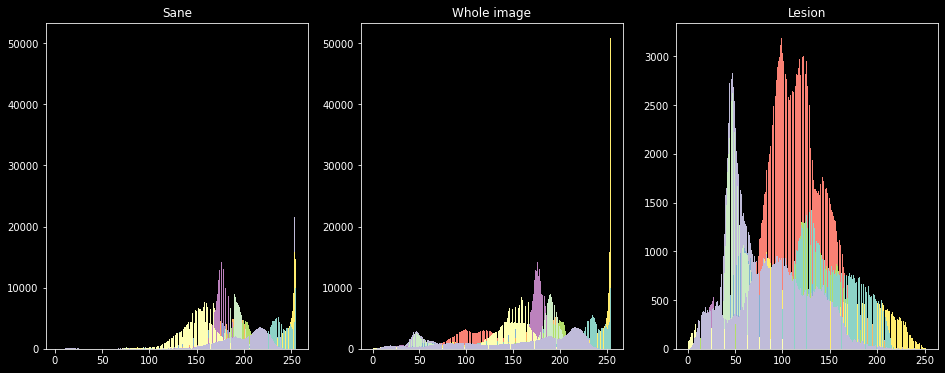

In [46]:
fig, (grid0, grid1, grid2) = plt.subplots(1, 3, figsize=(16, 6))
for k in range(number_image):
    lesion_area = imbr_tab[k][im_Seg_r_bool_tab[k]]
    sane_area = imbr_tab[k][np.logical_not(im_Seg_r_bool_tab[k])]
    grid0.hist(sane_area.flatten(), bins=255)
    grid0.set_title('Sane')
    grid1.hist(imbr_tab[k].flatten(), bins=255)
    grid1.set_title("Whole image")
    grid2.hist(lesion_area.flatten(), bins=255)
    grid2.set_title("Lesion")

On choisit alors pour la peau saine $\mu_1 = 210$ et pour les lésions $\mu_2 = 60$

In [47]:
import maxflow

m1 = 210
m2 = 60

### Optimisation du paramètre $\beta$

In [48]:
beta_list = np.linspace(0, 300, 2)
dice_tab = []
show_plots = 0
print(f"50 values of beta ranging from {beta_list.min()} to {beta_list.max()}")
for beta in beta_list:
    print(np.round(beta, 2), end=', ')
    ## Graph cut binaire
    dice_beta = 0
    for k in range(number_image):
        g = maxflow.Graph[float]()
        nodeids = g.add_grid_nodes(imbr_tab[k].shape)
        g.add_grid_edges(nodeids, beta)
        g.add_grid_tedges(nodeids, (imbr_tab[k] - m1)**2,
                          (m2 - imbr_tab[k])**2)
        flow = g.maxflow()
        sgm = g.get_grid_segments(nodeids)
        im_bin = 1 - np.int_(np.logical_not(sgm))

        dice_beta += 1 - dice(im_bin.flatten(), im_Seg_r_bool_tab[k].flatten())

    dice_tab.append(dice_beta / number_image)

50 values of beta ranging from 0.0 to 300.0
0.0, 300.0, 

best_beta = 0.0


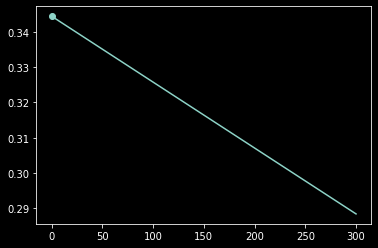

In [49]:
best_beta = beta_list[np.argmax(dice_tab)]
print(f"{best_beta = }")
plt.plot(beta_list, dice_tab)
plt.scatter(best_beta, np.max(dice_tab))
plt.show()

### Resultats

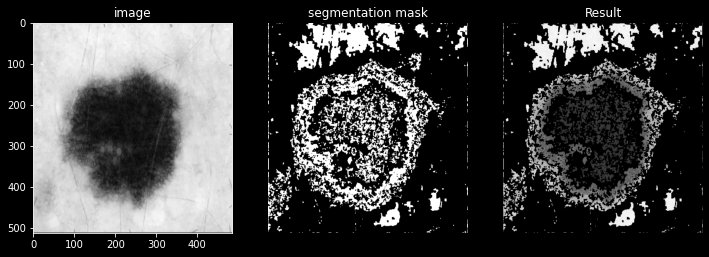

The dice similarity is  0.4788997527534278


In [50]:
best_beta = 50
k = 8
g = maxflow.Graph[float]()
nodeids = g.add_grid_nodes(imbr_tab[k].shape)
g.add_grid_edges(nodeids, best_beta)
g.add_grid_tedges(nodeids, (imbr_tab[k] - m1)**2, (m2 - imbr_tab[k])**2)
flow = g.maxflow()
sgm = g.get_grid_segments(nodeids)
im_bin = 1 - np.int_(np.logical_not(sgm))

fig = plt.figure(figsize=(12, 12))
grid = AxesGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.5)
grid[0].imshow(imbr_tab[k], cmap='gray')
#grid[0].axis('off')
grid[0].set_title("image")
grid[1].imshow(im_bin, cmap='gray')
grid[1].axis('off')
grid[1].set_title("segmentation mask")
grid[2].imshow(imbr_tab[k] * im_bin, cmap='gray')
grid[2].axis('off')
grid[2].set_title("Result")
plt.show()
print('The dice similarity is ',
      1 - dice(im_bin.flatten(), im_Seg_r_bool_tab[k].flatten()))

The dice similarity is  0.14787861354810872


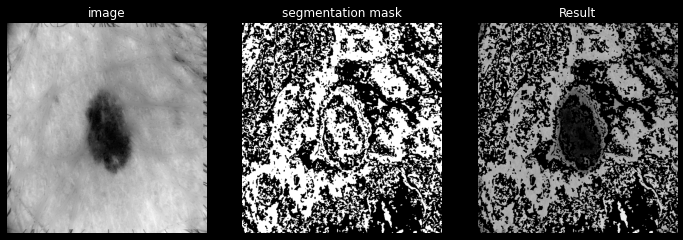

The dice similarity is  0.17676235683142438


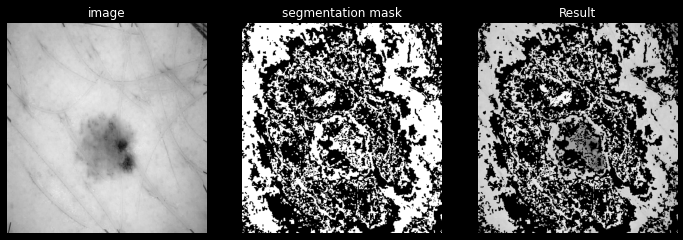

The dice similarity is  0.42562814573181107


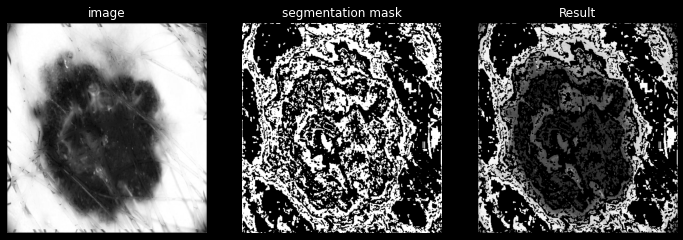

The dice similarity is  0.6810077656402824


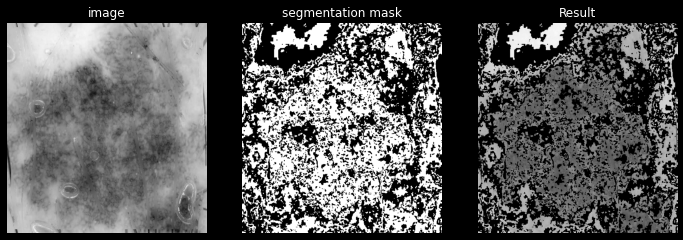

The dice similarity is  0.38879065643183575


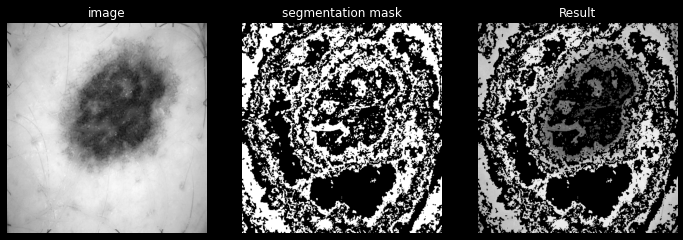

The dice similarity is  0.17452911698634876


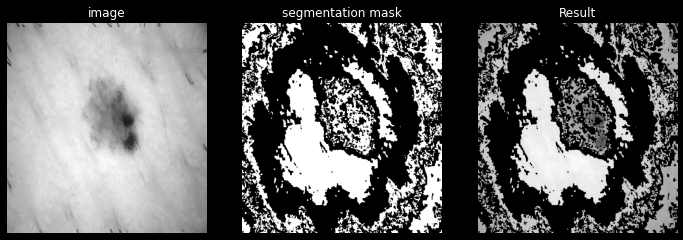

The dice similarity is  0.4195259026534426


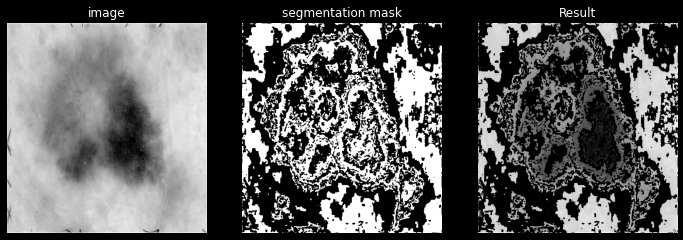

The dice similarity is  0.12433472803347279


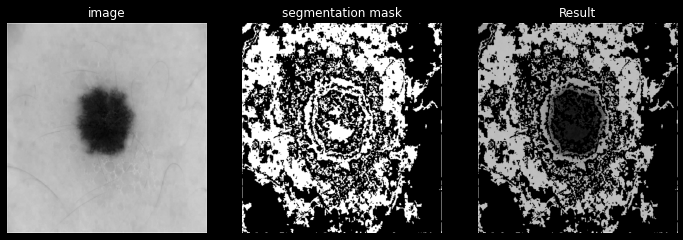

The dice similarity is  0.4788997527534278


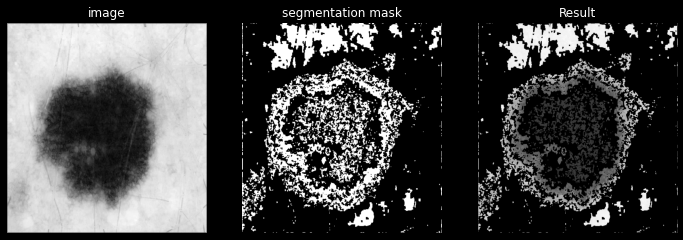

The dice similarity is  0.5544642543577256


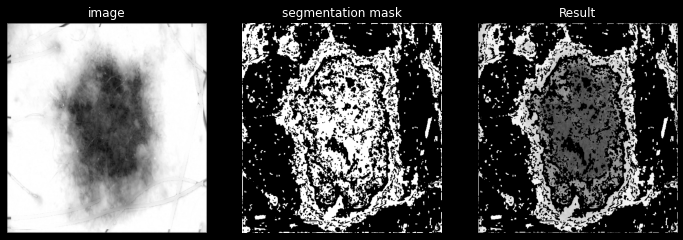

The dice similarity is  0.3772828147943982


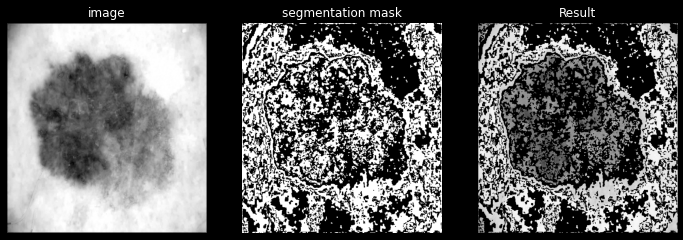

The dice similarity is  0.1497789135178592


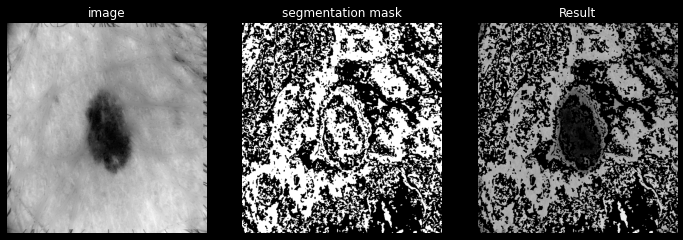

The dice similarity is  0.4604845011721802


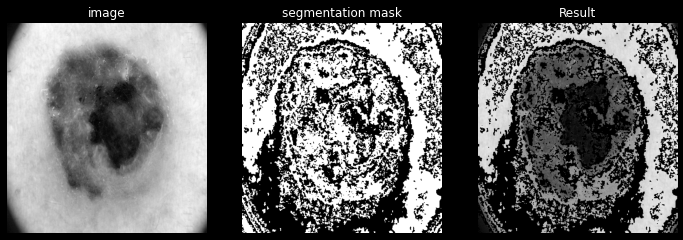

In [51]:
show_plots = 1

## Graph cut binaire
dice_tab_graphcut = [0 for k in range(number_image)]
for k in range(number_image):
    g = maxflow.Graph[float]()
    nodeids = g.add_grid_nodes(imbr_tab[k].shape)
    g.add_grid_edges(nodeids, best_beta)
    g.add_grid_tedges(nodeids, (imbr_tab[k] - m1)**2, (m2 - imbr_tab[k])**2)
    flow = g.maxflow()
    sgm = g.get_grid_segments(nodeids)
    im_bin = 1 - np.int_(np.logical_not(sgm))

    dice_tab_graphcut[k] = 1 - dice(im_bin.flatten(),
                                    im_Seg_r_bool_tab[k].flatten())
    if show_plots:
        print('The dice similarity is ', dice_tab_graphcut[k])
        fig = plt.figure(figsize=(12, 12))
        grid = AxesGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.5)
        grid[0].imshow(imbr_tab[k], cmap='gray')
        grid[0].axis('off')
        grid[0].set_title("image")
        grid[1].imshow(im_bin, cmap='gray')
        grid[1].axis('off')
        grid[1].set_title("segmentation mask")
        grid[2].imshow(imbr_tab[k] * im_bin, cmap='gray')
        grid[2].axis('off')
        grid[2].set_title("Result")
        plt.show()

##  Method comparaison

On constate que les méthodes par graph-cut, d'Otsu, par Kmeans, et region_merge sur toute l'image, sont toujours moins bien que les autres (ou leur version amélioré par merging). Finalement, en éliminant ces méthodes, on constate grâce au deuxième graphe que globalement, parmi les méthodes présentées, la meilleure est celle qui consiste à pré-traiter les images avec Dull Razor, puis appliquer la méthode des KMeans sur 2 clusters pour finir par récupérer la composante connexe correspondant à la lésion grâce au region-merging.

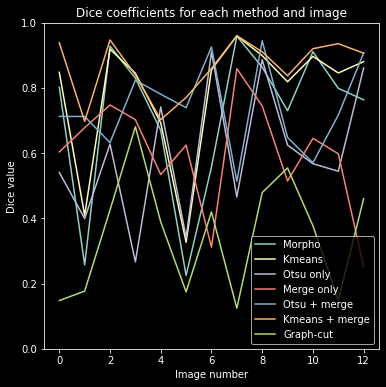

In [101]:
x = [k for k in range(number_image)]
plt.figure(figsize=(6, 6))
plt.plot(x, dice_tab_morpho, label="Morpho")
plt.plot(x, dice_tab_kmeans, label="Kmeans")
plt.plot(x, dice_tab_otsu, label="Otsu only")
plt.plot(x, dice_tab_merge, label="Merge only")
plt.plot(x, dice_tab_otsu_merged,label="Otsu + merge")
plt.plot(x, dice_tab_kmeans_merged,label="Kmeans + merge")
plt.plot(x, dice_tab_graphcut, label="Graph-cut")
plt.legend(loc=4)
plt.title("Dice coefficients for each method and image")
plt.ylabel("Dice value")
plt.xlabel("Image number")
plt.ylim(0, 1)
plt.show()

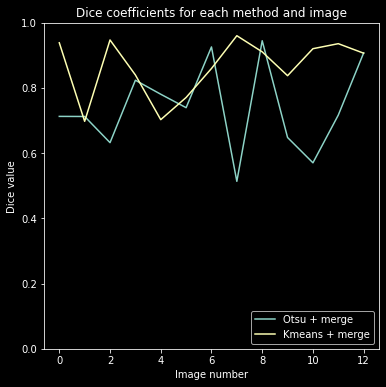

In [102]:
x = [k for k in range(number_image)]
plt.figure(figsize=(6, 6))
plt.plot(x, dice_tab_otsu_merged, label="Otsu + merge")
plt.plot(x, dice_tab_kmeans_merged, label="Kmeans + merge")
plt.legend(loc=4)
plt.title("Dice coefficients for each method and image")
plt.ylabel("Dice value")
plt.xlabel("Image number")
plt.ylim(0, 1)
plt.show()

---

# SECOND PART

---

**Question** Please develop a segmentation pipeline using a combination of the previous methods (or others) for at least one of the following applications.

# Abdominal CT 

You have at your disposal 6 abdominal CT scans of different subjects. Subjects may have renal tumor. You also have the manual segmentations for both kidney and, when present, the tumor.

In [54]:
if 'google.colab' in str(get_ipython()):
    from google_drive_downloader import GoogleDriveDownloader as gdd

    gdd.download_file_from_google_drive(
        file_id='1E-F5x83qaPRUrcdusfyOSgiZWf0pLDFl',
        dest_path='./abdominalCT.zip',
        unzip=True)

abdominalCT_path = Working_directory + 'abdominalCT'
#!ls './abdominalCT'
listImagesabdCT = glob.glob(abdominalCT_path + '/*-seg.tiff')
print('There are', len(listImagesabdCT), 'abdomical CT images')
print(listImagesabdCT)

There are 6 abdomical CT images
['./abdominalCT\\CTs1-seg.tiff', './abdominalCT\\CTs2-seg.tiff', './abdominalCT\\CTs3-seg.tiff', './abdominalCT\\CTs4-seg.tiff', './abdominalCT\\CTs5-seg.tiff', './abdominalCT\\CTs6-seg.tiff']


Reading image  ./abdominalCT\CTs1.tiff
[  0 127 255]


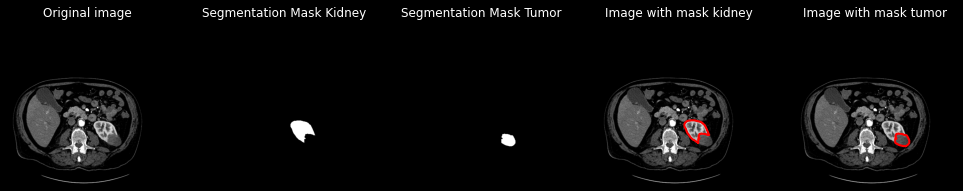

Reading image  ./abdominalCT\CTs2.tiff
[  0 127 255]


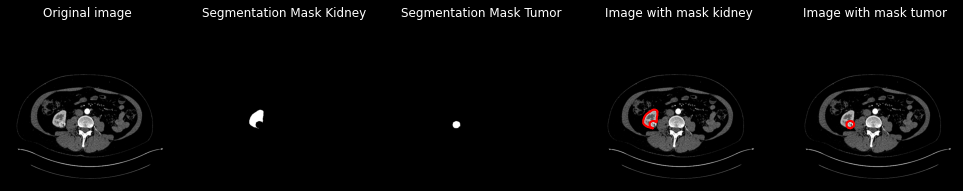

Reading image  ./abdominalCT\CTs3.tiff
[  0 127 255]


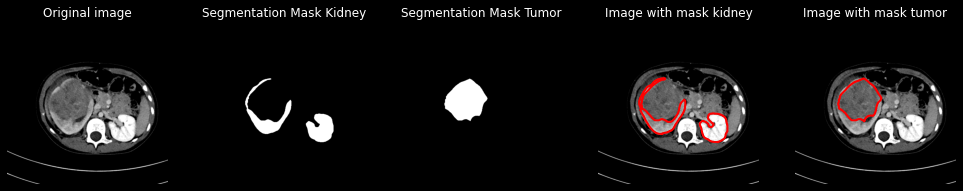

Reading image  ./abdominalCT\CTs4.tiff
[  0 127]
There is no tumor


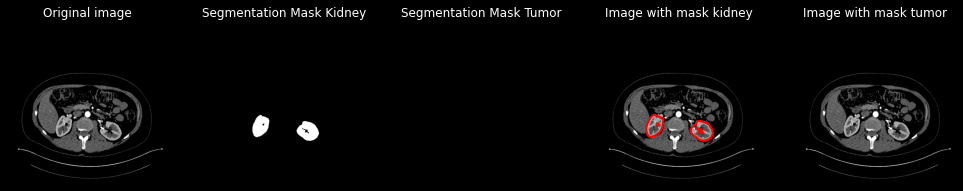

Reading image  ./abdominalCT\CTs5.tiff
[  0 127]
There is no tumor


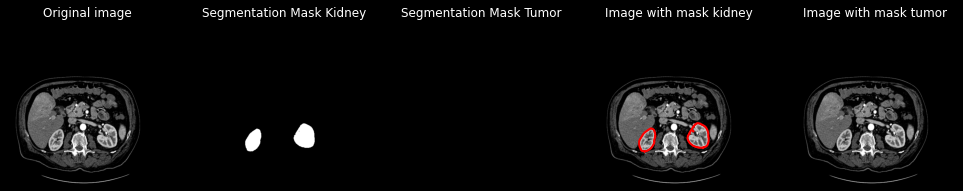

Reading image  ./abdominalCT\CTs6.tiff
[  0 127 255]


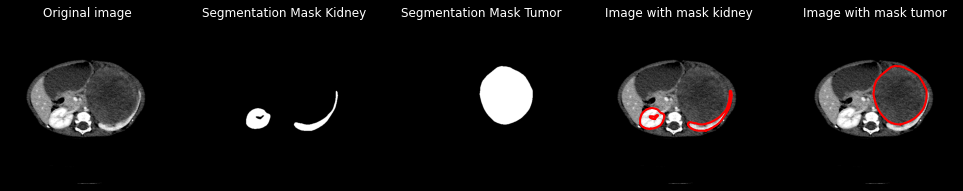

In [55]:
from skimage.measure import find_contours

# Choose a figure and plot it with the ground truth segmentation
for k in range(6):
    indexIm = k  # between 0 and 5

    # Abdominal CT
    filename_Segmentation = listImagesabdCT[indexIm]
    im_Seg = imread(filename_Segmentation)
    filename = filename_Segmentation[:-9] + '.tiff'
    imG = imread(filename)

    print('Reading image ', filename)
    print(np.unique(im_Seg))

    if imG.shape != im_Seg.shape:
        raise NameError(
            'image and mask should have the same shape, problem...')

    # In Im Seg, we may have two values: 127 is for kidney and 255 for renal tumor
    maskKidney = im_Seg == 127
    if np.sum(maskKidney) == 0:
        print('There is no kidney')
    contourMaskKidney = find_contours(maskKidney, 0.5)

    maskTumor = im_Seg == 255
    if np.sum(maskTumor) == 0:
        print('There is no tumor')
    contourMaskTumor = find_contours(maskTumor, 0.5)

    fig = plt.figure(figsize=(17, 7))
    grid = AxesGrid(fig, 111, nrows_ncols=(1, 5), axes_pad=0.5)
    grid[0].imshow(imG, cmap='gray')
    grid[0].axis('off')
    grid[0].set_title("Original image")
    grid[1].imshow(maskKidney, cmap='gray')
    grid[1].axis('off')
    grid[1].set_title("Segmentation Mask Kidney")
    grid[2].imshow(maskTumor, cmap='gray')
    grid[2].axis('off')
    grid[2].set_title("Segmentation Mask Tumor")
    grid[3].imshow(imG, cmap='gray')
    for contour in contourMaskKidney:
        grid[3].plot(contour[:, 1], contour[:, 0], linewidth=2, c='r')
    grid[3].axis('off')
    grid[3].set_title("Image with mask kidney")
    grid[4].imshow(imG, cmap='gray')
    for contour in contourMaskTumor:
        grid[4].plot(contour[:, 1], contour[:, 0], linewidth=2, c='r')
    grid[4].axis('off')
    grid[4].set_title("Image with mask tumor")
    plt.show()

# Brain MRI

Here you can select medial slices of the brain of 4 different subjects. You also have manual segmentations of the corpus callosum.

In [56]:
if 'google.colab' in str(get_ipython()):
    from google_drive_downloader import GoogleDriveDownloader as gdd

    gdd.download_file_from_google_drive(
        file_id='1UTSW2nGWV8SBE_ILZQkM-jQvnfoQKDlm',
        dest_path='./brainMRI.zip',
        unzip=True)

In [57]:
brainMRI_path = Working_directory + 'brainMRI'
!ls './brainMRI'

listImagesbrainMRI=glob.glob(brainMRI_path + '/*-seg.png')
print('There are', len(listImagesbrainMRI),  'brain MRI images')
print(listImagesbrainMRI)

There are 4 brain MRI images
['./brainMRI\\MRIs1-seg.png', './brainMRI\\MRIs2-seg.png', './brainMRI\\MRIs3-seg.png', './brainMRI\\MRIs4-seg.png']


'ls' n'est pas reconnu en tant que commande interne
ou externe, un programme ex‚cutable ou un fichier de commandes.


./brainMRI\MRIs1-seg.png
Reading image  ./brainMRI\MRIs1.png


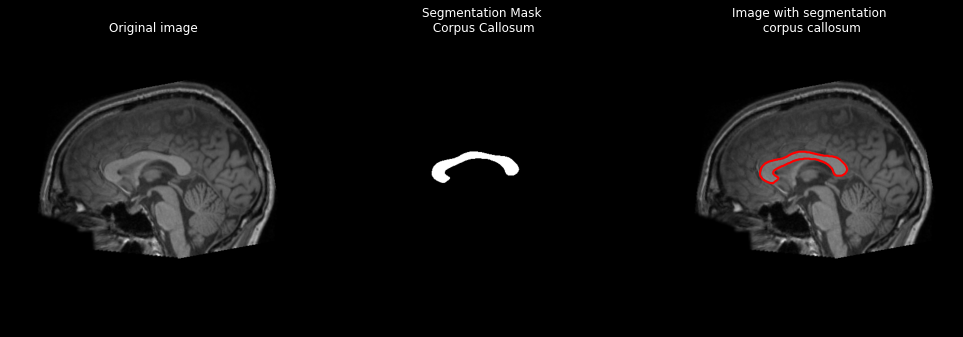

./brainMRI\MRIs2-seg.png
Reading image  ./brainMRI\MRIs2.png


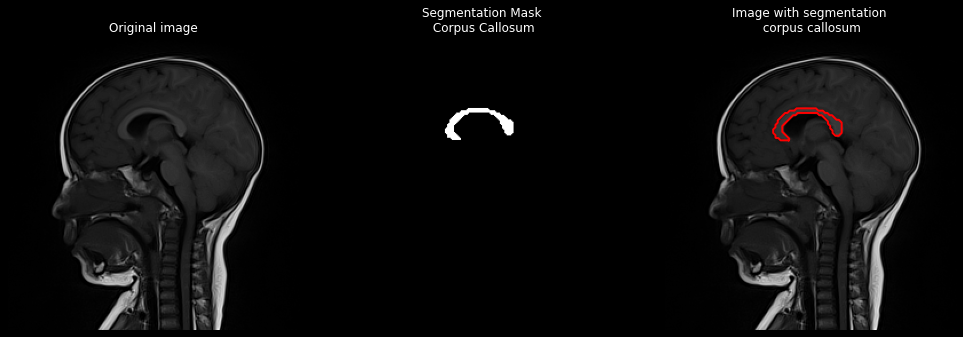

./brainMRI\MRIs3-seg.png
Reading image  ./brainMRI\MRIs3.png


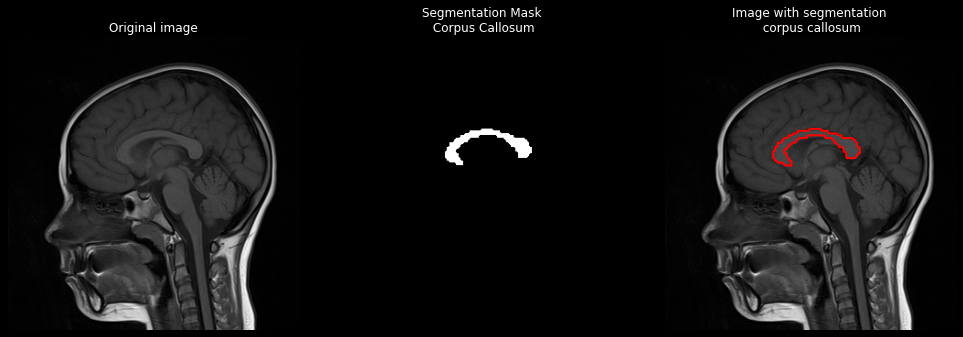

./brainMRI\MRIs4-seg.png
Reading image  ./brainMRI\MRIs4.png


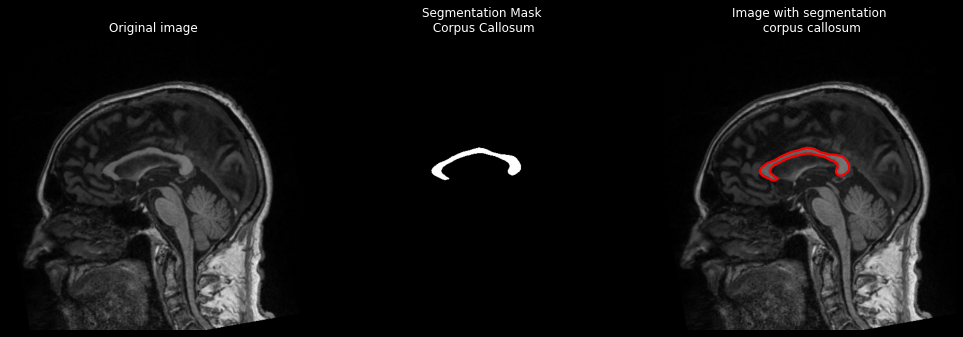

In [58]:
# Choose a figure and plot it with the ground truth segmentation

indexIm = 1  # between 0 and 3
for indexIm in range(4):
    # Brain MRI
    filename_Segmentation = listImagesbrainMRI[indexIm]
    print(filename_Segmentation)
    im_Seg = imread(filename_Segmentation)
    filename = filename_Segmentation[:-8] + '.png'
    imG = imread(filename)

    print('Reading image ', filename)

    if imG.shape != im_Seg.shape:
        raise NameError(
            'image and mask should have the same shape, problem...')

    # In Im Seg we have masks of the corpus callosum

    maskCC = im_Seg == 255
    contourMask = find_contours(maskCC, 0.5)

    fig = plt.figure(figsize=(17, 7))
    grid = AxesGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.5)
    grid[0].imshow(imG, cmap='gray')
    grid[0].axis('off')
    grid[0].set_title("Original image")
    grid[1].imshow(maskCC, cmap='gray')
    grid[1].axis('off')
    grid[1].set_title("Segmentation Mask\n Corpus Callosum")
    grid[2].imshow(imG, cmap='gray')
    for contour in contourMask:
        grid[2].plot(contour[:, 1], contour[:, 0], linewidth=2, c='r')
    grid[2].axis('off')
    grid[2].set_title("Image with segmentation\n corpus callosum")
    plt.show()

### My pipeline

On mettre en place une segmentation semi-automatique basée sur l'algorithme de région merging. On va donc tout d'abord charger les images et les ramener dans l'intervalle [0,255]. Ensuite un opérateur capable de reconnaitre le corps calleux va devoir pointer un point de celui-ci sur le scanner pour qu'on puisse en déterminer les coordonnées. Ce point va servir d'initialisation à l'algorithme de region merging. On va essayer d'optimiser le paramètre $\tau$ de tolérance de cet algorithme.

Les résultats observés sont concluants, on obtient des coefficients de Dice autour de 0.85. Néanmoins on constate que pour une des images la segmentation ne réussit pas à englober toute la région voulue. En effet on constate que le corps calleux présente des régions d'intensité différentes. Pour réussir à les prendre toutes deux dans la segmentation, il faudrait augmenter $\tau$, mais alors on prendrait d'autres régions. Une solution à ce problème pourrait être de fonctionner en plusieurs passages. L'opérateur pourrait spécifier autant de points qu'il le souhaite qui appartiennent à la région à segmenter, de préférence de sorte à ce qu'ils couvrent les plages d'intensité de la région. On lance alors l'algorithme sur chacun de ces points et on fusionne les différents masques obtenus. Avec cette méthode on obtient des résultats plus probants.

Pour améliorer l'algorithme il faudrait déjà le rendre plus robuste aux cas limites. Par exemple dans l'image 2, des zones proches du corps calleux ont une intensité très proche de celui-ci de sorte qu'elles sont systématiquement incluses dans la segmentation. Il faudrait alors avoir un $\tau$ plus faible mais celà impacterait la segmentation des autres images. En l'état je ne vois pas comment remédier à ce problème. 

Ensuite il serait sans doute préférable d'avoir un algorithme totalement automatique sans intervention d'un opérateur expérimenté. Une technique envisageable, mais extrêmement couteuse en temps de calcul, serait de lancer l'algorithme de region merging (en gardant la valeur $\tau$ trouvée avant) à partir d'une grille de point d'initialisation qui couvre toute l'image, uniquement le cerveau si possible même. On obtient alors un ensemble de structures a priori caractéristiques du cerveau. Il s'agit ensuite de déterminer laquelle correspond au corps calleux. Peut-être serait-il possible de disposer d'un atlas de référence surlequel on recaler toutes les structures trouvées. En utilisant une métrique de similarité pertinente on peut envisager de déterminer les formes correspondantes au corps calleux. A supposer que la zone du corps calleux présente différentes intensités (comme dans une des images ici) et que l'on a tout de même retenue les formes y correspondant, il suffit finalement de fusionner les différents masques obtenus pour obtenir la segmentation finale.

In [59]:
from bokeh.plotting import figure, output_file, show
from bokeh.plotting import show as showbokeh
from bokeh.io import output_notebook

output_notebook()


def affiche_pour_colab(im,
                       MINI=None,
                       MAXI=None,
                       titre=''):  #special colab, don't look

    def normalise_image_pour_bokeh(X, MINI, MAXI):
        if MAXI == None:
            MAXI = np.max(X)
        if MINI == None:
            MINI = np.min(X)
        imt = np.copy(X.copy())
        imt = (np.clip(imt, MINI, MAXI) / (MAXI - MINI))
        imt[imt < 0] = 0
        imt[imt > 1] = 1
        imt *= 255
        sortie = np.empty((*imt.shape, 4), dtype=np.uint8)
        for k in range(3):
            sortie[:, :, k] = imt
        sortie[:, :, 3] = 255
        return sortie

    img = im
    img = normalise_image_pour_bokeh(np.flipud(im), MINI, MAXI)
    p = figure(tooltips=[("x", "$x"), ("y", "$y"), ("value", "@image")],
               y_range=[im.shape[0], 0],
               x_range=[0, im.shape[1]],
               title=titre)
    # p.x_range.range_padding = p.y_range.range_padding = 0
    # must give a vector of images
    p.image(image=[np.flipud(im)],
            x=0,
            y=im.shape[0],
            dw=im.shape[1],
            dh=im.shape[0],
            palette="Greys9",
            level="image")
    p.xgrid.visible = False
    p.ygrid.visible = False
    showbokeh(p)


def affiche(im, MINI=0.0, MAXI=None, titre='', printname=False):
    affiche_pour_colab(
        im, MINI=MINI, MAXI=MAXI,
        titre=titre)  # under google colab many options disappear

Loading BokehJS ...

In [60]:
def getImage(indexIm):
    # Return the image and corresponding mask for the index indexIm
    filename_Segmentation = listImagesbrainMRI[indexIm]
    im_Seg = imread(filename_Segmentation)
    filename = filename_Segmentation[:-8] + '.png'
    imG = imread(filename)
    if imG.shape != im_Seg.shape:
        raise NameError(
            'image and mask should have the same shape, problem...')
    # In Im Seg we have masks of the corpus callosum
    maskCC = im_Seg == 255
    return imG, maskCC

In [61]:
def normalization(imG):
    img = imG / (imG.max() - imG.min()) * 255
    return img

In [62]:
def mysegmentation(indexIm, seed_points, tau=10, tol=5000):
    imG, maskCC = getImage(indexIm)
    img = normalization(imG)
    img_out = np.zeros(img.shape)
    seg_init = np.zeros(img.shape)
    for k in range(len(seed_points)):
        img_out_k, seg_init_k, _ = segmentation_region_growing(
            img, seed_points[k], tau)
        img_out = np.logical_or(img_out, img_out_k)
        seg_init = np.logical_or(seg_init, seg_init_k)
    return img, img_out, seg_init, maskCC

In [63]:
def showResult(img, img_out_region_growing, seg_init, maskCC):
    dice_result = 1 - dice(img_out_region_growing.flatten(), maskCC.flatten())

    contourMask = find_contours(maskCC, 0.5)
    contourSegm = find_contours(img_out_region_growing, 0.5)
    fig = plt.figure(figsize=(16, 16))
    grid = AxesGrid(fig, 111, nrows_ncols=(1, 3), axes_pad=0.5)
    grid[1].imshow(maskCC, cmap='gray')
    grid[1].axis('off')
    grid[1].set_title("Segmentation Mask\n Corpus Callosum")
    grid[0].imshow(img_out_region_growing, cmap='gray')
    grid[0].axis('off')
    grid[0].set_title("Region growing segmentation")
    grid[2].imshow(imG, cmap='gray')
    for contour in contourMask:
        grid[2].plot(contour[:, 1], contour[:, 0], linewidth=2, c='r')
    for contour in contourSegm:
        grid[2].plot(contour[:, 1], contour[:, 0], linewidth=1, c='b', ls='--')
    grid[2].axis('off')
    grid[2].set_title("Image with segmentation\n corpus callosum")
    print('The dice similarity is ', dice_result)
    plt.show()

#### Initializing seed points

Pour chaque image, il faut afficher l'image, repérer le corps calleux, puis déterminer les coordonnées de points à l'intérieur de celle-ci.

In [76]:
# On obtient alors pour chaque image, dans l'ordre, les points suivants
seed_pts_tab = [[[228, 302]], [[63, 126]], [[121, 205]],
                [[232, 181], [226, 312]]]

In [65]:
imG, maskCC = getImage(2)
affiche(imG)

#### Hyper parameters optimisation

In [66]:
tau_tab = np.linspace(0, 20, 40)
print("There'll be", len(tau_tab), "iterations")
print("Iteration number :")
dice_tab = [0 for k in range(len(tau_tab))]
for tau, n_tau in zip(tau_tab, range(len(tau_tab))):
    print(n_tau + 1, end=', ')
    for k in range(4):
        imG, img_out_region_growing, seg_init, maskCC = mysegmentation(
            k, seed_pts_tab[k], tau=tau)
        dice_tab[n_tau] += 1 - dice(img_out_region_growing.flatten(),
                                    maskCC.flatten())
        #showResult(imG,img_out_region_growing,seg_init, maskCC)
    dice_tab[n_tau] /= 4

There'll be 40 iterations
Iteration number :
1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 

best_tau = 11.282051282051281


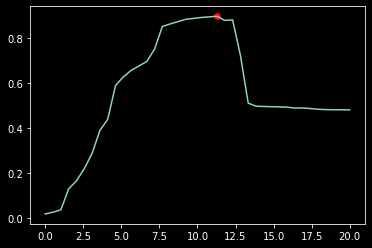

In [67]:
best_tau = tau_tab[np.argmax(dice_tab)]
print(f"{best_tau = }")
plt.plot(tau_tab, dice_tab)
plt.scatter(best_tau, np.max(dice_tab), c='r')
plt.show()

#### Results

The dice similarity is  0.9283959947099943


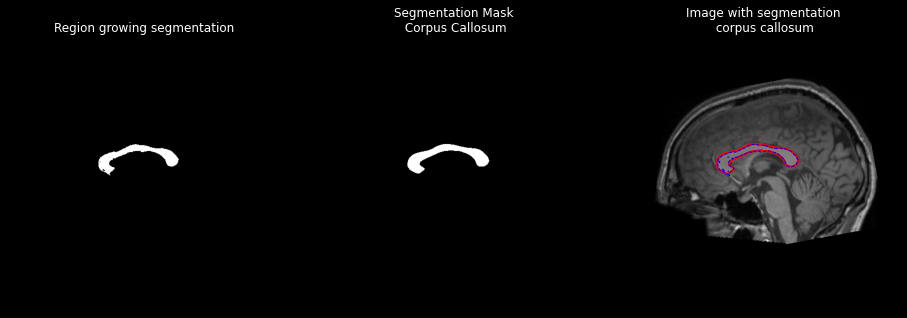

The dice similarity is  0.9077090119435396


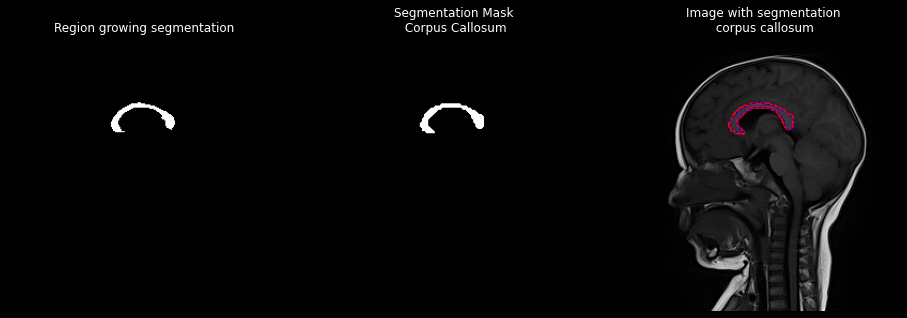

The dice similarity is  0.8492922564529559


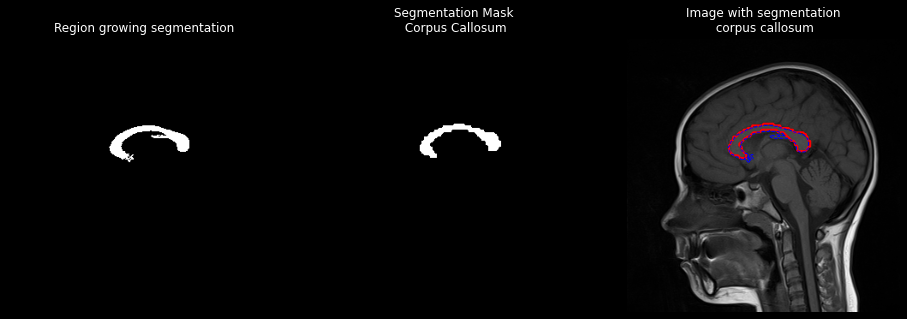

The dice similarity is  0.9023427217688865


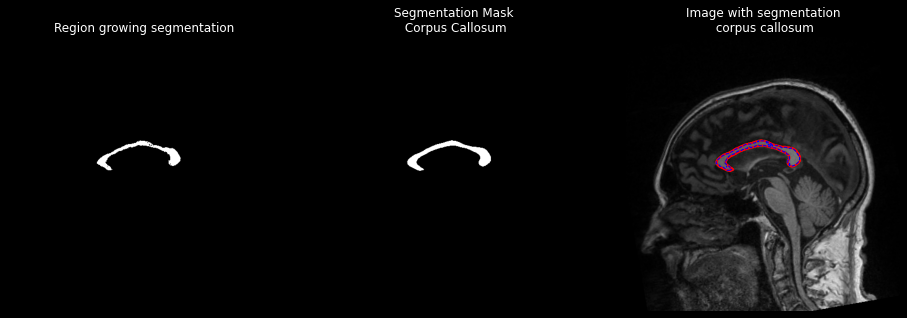

In [78]:
for k in range(4):
    imG, img_out_region_growing, seg_init, maskCC = mysegmentation(
        k, seed_pts_tab[k], tau=best_tau)
    showResult(imG, img_out_region_growing, seg_init, maskCC)

# MRI heart

The last section is about MRI sequences of the heart. Your goal is to segment the left ventricule. Be careful, the segmentation is not a maks but a series of points (landmarks). To obtain a binary mask, you should first interpolate the points (using for instance a spline).


Je n'ai pas développeé de méthodes de segmentation pour le coeur. J'ai uniquement implémenté de quoi récupérer un masque binaire à partir des landmarks.

In [79]:
if 'google.colab' in str(get_ipython()):
  from google_drive_downloader import GoogleDriveDownloader as gdd

  gdd.download_file_from_google_drive(file_id='1BZtShVk7LVG032GOlcLs0K4Eaj6gnBed',
                                      dest_path='./MRIheart.zip',
                                      unzip=True)    

In [80]:
from scipy.io import loadmat


MRIheart_path = Working_directory + 'MRIheart/'
!ls './MRIheart'

data=loadmat(MRIheart_path + 'dataMRIheart.mat')
data=data['data']
seg=loadmat(MRIheart_path + 'segMRIheart.mat')
seg=seg['seg']

print('MRI volume of the heart composed of', data.shape[2], 'slices along the z axis and', data.shape[3], 
'temporal frames. Each slice is an image ', data.shape[0], ' x ',  data.shape[1])
print('For each slice and at each time frame we have a manual segmentation composed of',seg[4,4].shape[0] , '2D landmarks')

print('Be careful, some slices do not have the left ventricle and the manual segmentation is not simply empty but it contains the value:', seg[0,0] )

MRI volume of the heart composed of 11 slices along the z axis and 20 temporal frames. Each slice is an image  256  x  256
For each slice and at each time frame we have a manual segmentation composed of 65 2D landmarks
Be careful, some slices do not have the left ventricle and the manual segmentation is not simply empty but it contains the value: [[-99999]]


'ls' n'est pas reconnu en tant que commande interne
ou externe, un programme ex‚cutable ou un fichier de commandes.


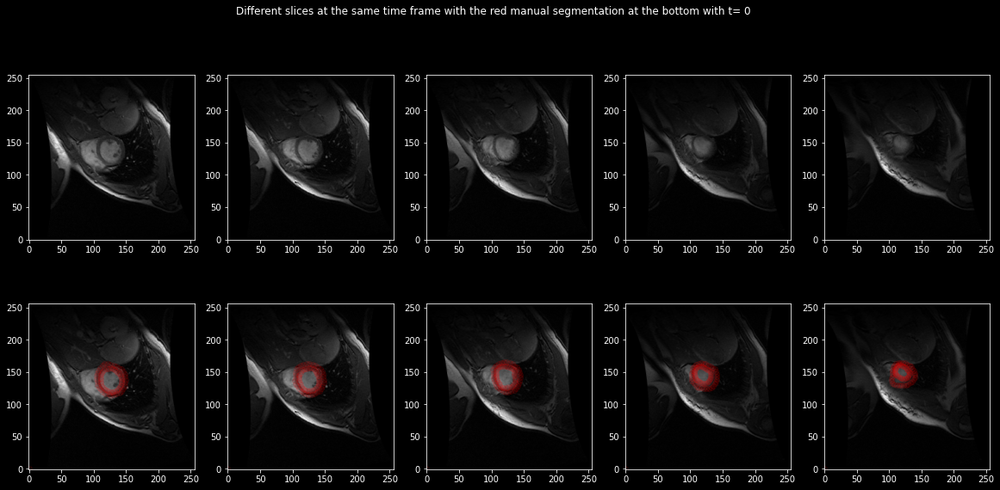

In [81]:
seg_show = 1
for t in range(1):
    plt.figure(figsize=(20, 9))
    plt.suptitle('Different slices at the same time frame with the red manual segmentation at the bottom with t= '+str(t))

    for k in range(4,9):
        plt.subplot(2, 5, k-3)
        plt.imshow(data[:,:,k,t],cmap="gray")
        plt.gca().invert_yaxis() 

    if seg_show:
        for k in range(4,9):
            plt.subplot(2, 5, k+2)
            plt.imshow(data[:,:,k,t],cmap="gray")
            plt.gca().invert_yaxis() 
            plt.scatter(seg[k,t][:,0], seg[k,t][:,1], c='r',alpha=0.1) 
    plt.show()
    

In [82]:
seg[2][0].shape

(65, 2)

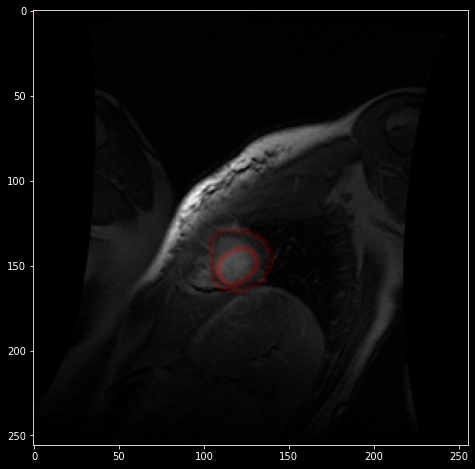

In [94]:
k=8
plt.figure(figsize=(8,8))
plt.imshow(data[:,:,k,1],cmap="gray")
plt.scatter(seg[k,t][:,0], seg[k,t][:,1], c='r',alpha=0.1)
plt.show()
affiche(data[:,:,k,1])

Les landmarks de 0 à 31 correspondenr au cercle intérieur, de 33 à 65 c'est l'autre. Le point 32 est en [0,0].

In [84]:
def getImages(k,t):
    img_n_t = data[:,:,k,t]
    seg_n_t = seg[k,t]
    return img_n_t, seg_n_t

# Binary mask from Landmarks

In [87]:
from PIL import Image, ImageDraw

def getMask(seg_n_t,img_n_t):
    width = img_n_t.shape[0]
    height = img_n_t.shape[1]

    if seg_n_t.shape == (65,2):
        inner_layer = seg_n_t[:32]
        inner_layer = np.append(inner_layer,[inner_layer[0]],axis=0)

        outer_layer = seg_n_t[33:]
        outer_layer = np.append(outer_layer,[outer_layer[0]],axis=0)

        polygon = list(outer_layer.flatten().astype(np.uint16))
        img = Image.new('L', (width, height), 0)
        ImageDraw.Draw(img).polygon(polygon, outline=1, fill=1)
        mask_outer = np.array(img)

        polygon = list(inner_layer.flatten().astype(np.uint16))
        img = Image.new('L', (width, height), 0)
        ImageDraw.Draw(img).polygon(polygon, outline=1, fill=1)
        mask_inner = np.array(img)
        
        mask = np.logical_xor(mask_inner,mask_outer)
        
    else:
        print("There are no landmark")
        mask = np.zeros((width,height))
    return mask

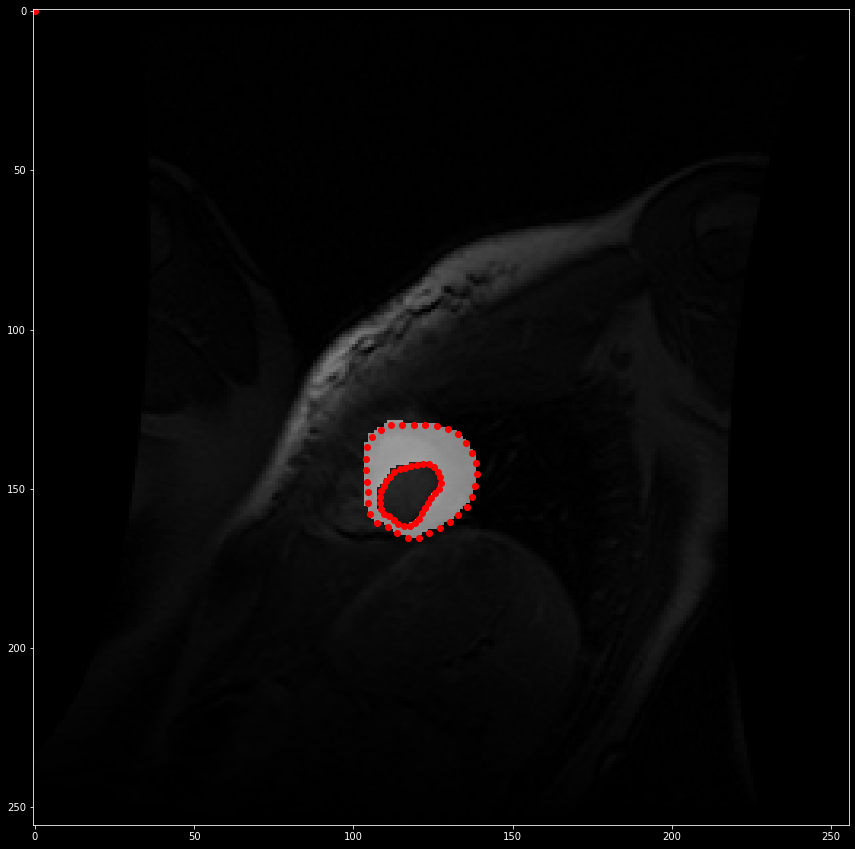

In [93]:
img_n_t, seg_n_t = getImages(8,2)
m =getMask(seg_n_t,img_n_t)
plt.figure(figsize=(15,15))
plt.imshow(img_n_t,cmap='gray')
plt.imshow(m,cmap='gray',alpha=0.5)
plt.scatter(seg_n_t[:,0], seg_n_t[:,1], c='r')